<a href="https://colab.research.google.com/github/andreailic/PrincipiPrezentacijeIPrepoznavanjaOblika/blob/main/ProjekatAndreaIlic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Student**: Andrea Ilić IT70/2019

## **Tema**: Generative Adversarial Networks - **GAN**

**Uvod**

Tema ovog projekta je Generative Adversarial Networks (GAN). GAN je uzbudljiva nedavna inovacija u mašinskom učenju. Ove mreže su pristup generativnom modeliranju koristeći metode dubokog učenja, kao što su konvolucione neuronske mreže. Generativno modeliranje je zadatak učenja bez nadzora u mašinskom učenju koji uključuje automatsko otkrivanje i učenje pravilnosti ili obrazaca u ulaznim podacima na takav način da se model može koristiti za generisanje ili izlaz novih primera koji su verovatno mogli biti izvučeni iz originalnog skupa podataka.

GAN se sastoje od dve komponente:

**Generator** - generiše nove instance podataka, odnosno veštački proizvodi izlaze koji bi mogli da zamene prave podatke

**Diskriminator** - pokušava da razlikuje generisane odnosno lažne podatke od stvarnog skupa podataka.

**Primeri upotrebe GAN**:

- Generisanje slika

- Modifikacija slika

- Starenje lica

**Kako funkcionišu GAN-ovi**
Prvi korak u uspostavljanju GAN-a je identifikacija željenog krajnjeg rezultata i prikupljanje početnog skupa podataka na osnovu tih parametara. Ovi podaci se zatim randomiziraju i unose u generator dok ne steknu osnovnu tačnost u stvaranju rezultata.

Posle toga, generisane slike se unose u diskriminator zajedno sa stvarnim tačkama podataka iz originalnog koncepta. Diskriminator filtrira informacije i vraća verovatnoću između 0 i 1 da bi prikazao autentičnost svake slike (1 korelira sa stvarnom, a 0 korelira sa lažnom). Zatim se ove vrednosti ručno proveravaju za uspeh i ponavljaju dok se ne postigne željeni ishod.

*Dataset*

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1YbZ6ttxH2L-BBzDUfxI0KVibyLdri5Wc' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1YbZ6ttxH2L-BBzDUfxI0KVibyLdri5Wc" -O data.zip && rm -rf /tmp/cookies.txt

--2023-06-16 11:21:13--  https://docs.google.com/uc?export=download&confirm=t&id=1YbZ6ttxH2L-BBzDUfxI0KVibyLdri5Wc
Resolving docs.google.com (docs.google.com)... 142.251.161.113, 142.251.161.102, 142.251.161.139, ...
Connecting to docs.google.com (docs.google.com)|142.251.161.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0g-9s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/mg5pfd46hl475hm0l8r5f9knle1imedm/1686914400000/12172178362461080244/*/1YbZ6ttxH2L-BBzDUfxI0KVibyLdri5Wc?e=download&uuid=673407ff-c9ab-43fa-8a60-68e944d642b8 [following]
--2023-06-16 11:21:13--  https://doc-0g-9s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/mg5pfd46hl475hm0l8r5f9knle1imedm/1686914400000/12172178362461080244/*/1YbZ6ttxH2L-BBzDUfxI0KVibyLdri5Wc?e=download&uuid=673407ff-c9ab-43fa-8a60-68e944d642b8
Resolving doc-0g-9s-docs.googleusercontent.com (doc-0g-9s-docs.googleusercontent.com)... 142.251.171.

In [ ]:
import zipfile
from zipfile import ZipFile
import os

!mkdir '../data'
!unzip data.zip

with ZipFile('data.zip', 'r') as zipObj:
   zipObj.extractall('/content/data/')




mkdir: cannot create directory ‘../data’: File exists
Archive:  data.zip
replace LICENSE? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
print(os.listdir("/content/data/"))

['metadata.csv', 'test.csv', 'LICENSE', 'test', 'jurassic-world', 'star-wars', 'index.csv', 'harry-potter', 'marvel']


In [87]:
import os
import shutil

data_path = '/content/data/'
combined_folder = './combined_folder/'

# Kreiranje izlaznog foldera
os.makedirs(combined_folder, exist_ok=True)

# Lista glavnih foldera za obradu
folders = ['jurassic-world', 'star-wars', 'harry-potter', 'marvel']

# Kopiranje slika iz podfoldera u izlazni folder
for folder in folders:
    folder_path = os.path.join(data_path, folder)
    for root, dirs, files in os.walk(folder_path):
        for i, file in enumerate(files):
            if file.endswith(".jpg"):
                src = os.path.join(root, file)
                dst = os.path.join(combined_folder, f"{folder}_{i}_{file}")
                shutil.copyfile(src, dst)

print("Sve slike su kopirane u izlazni folder:", combined_folder)


Sve slike su kopirane u izlazni folder: ./combined_folder/


In [88]:
import os

combined_folder = './combined_folder/'

# Lista svih slika u folderu
image_list = []

# Rekurzivno pretraživanje foldera i dodavanje slika u listu
for root, dirs, files in os.walk(combined_folder):
    for file in files:
        if file.endswith(".jpg"):
            image_list.append(file)

# Broj slika
num_images = len(image_list)

print("Ukupan broj slika u folderu (uključujući podfoldere):", num_images)


Ukupan broj slika u folderu (uključujući podfoldere): 115


 *Importovanje biblioteka*

In [ ]:
from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm

*Prikaz slučajnih slika*

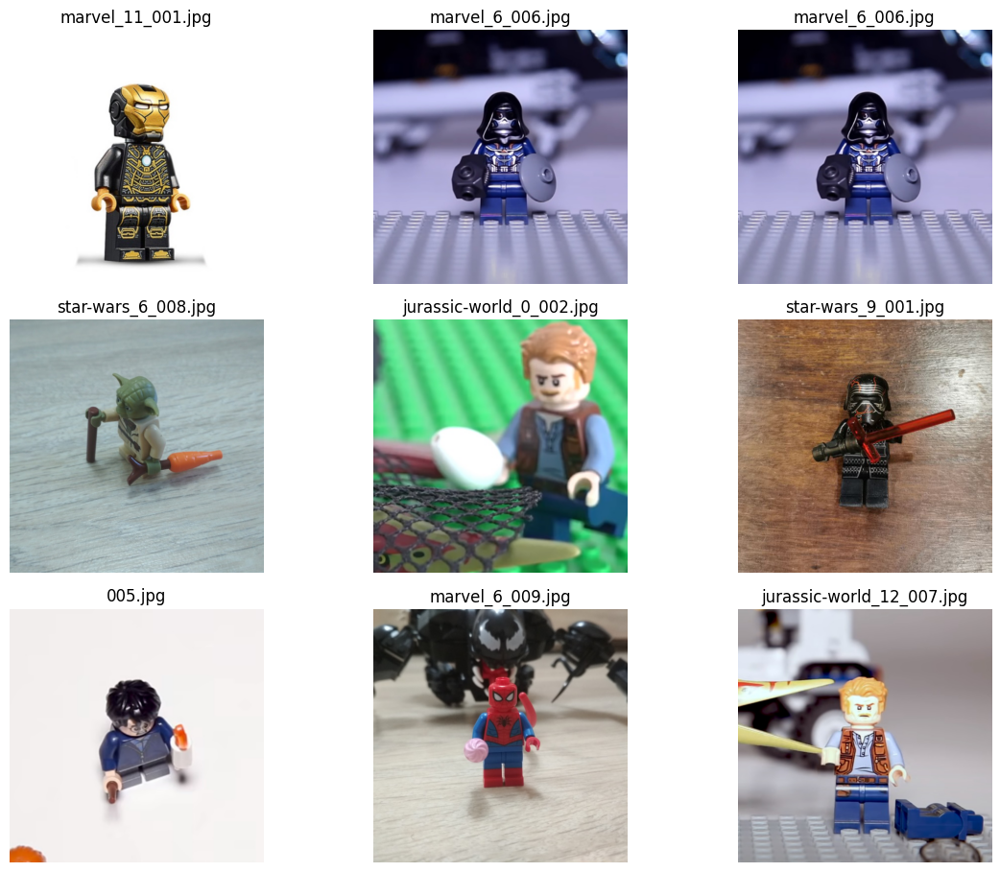

In [106]:
PATH = './combined_folder/'
images = os.listdir(PATH)
less_images = images[0:5000:1]

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(less_images))
    img = plt.imread(PATH + less_images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(less_images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])


*Podešavanje dimenzija slika*

In [117]:
import os
from PIL import Image
from torch.utils.data import Dataset

class ImageDataset(Dataset):
    def __init__(self, root, transform=None):
        self.root = root
        self.transform = transform
        self.img_paths = self._get_img_paths()
        self.images = self._load_imgs()

    def __getitem__(self, index):
        img = self.images[index]
        if self.transform is not None:
            img = self.transform(img)
        return img

    def __len__(self):
        return len(self.images)

    def _get_img_paths(self):
        extensions = ['.jpg', '.jpeg', '.png']
        img_paths = []
        for subdir, dirs, files in os.walk(self.root):
            for file in files:
                ext = os.path.splitext(file)[1].lower()
                if ext in extensions:
                    img_paths.append(os.path.join(subdir, file))
        return img_paths

    def _load_imgs(self):
        images = []
        for img_path in self.img_paths:
            try:
                img = Image.open(img_path)
                images.append(img)
            except Exception as e:
                print(f"Error loading image: {img_path}")
                print(f"Error message: {str(e)}")
        return images

# Primer korišćenja
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

dataset = ImageDataset(root='./combined_folder', transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, shuffle=True, batch_size=32)

images = next(iter(dataloader))
print(images.shape)


torch.Size([32, 3, 64, 64])


In [119]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                               transforms.CenterCrop(64),
                               transforms.RandomHorizontalFlip(p=0.5),
                               transforms.RandomApply(random_transforms, p=0.2),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

dataset = ImageDataset(root='./combined_folder', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                          batch_size=batch_size)

imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

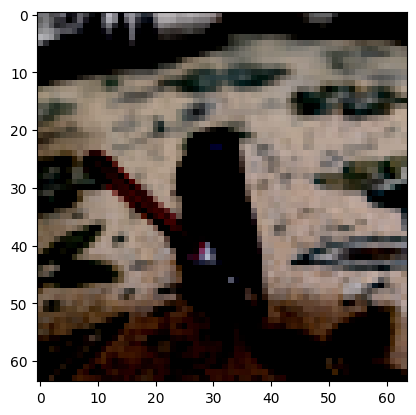

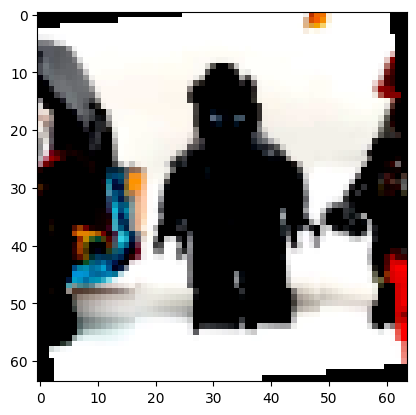

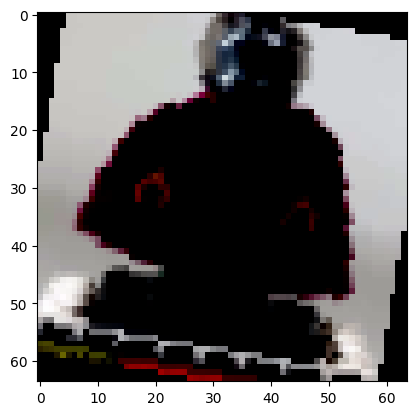

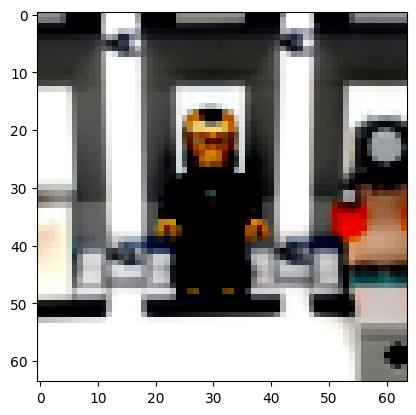

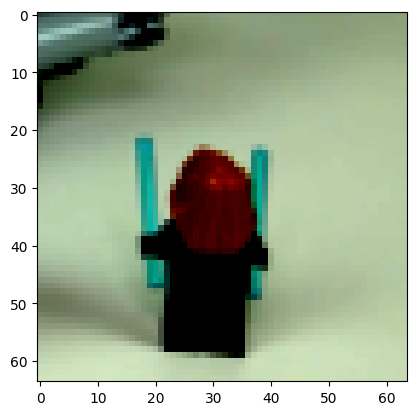

In [120]:
for i in range(5):
    plt.imshow(imgs[i])
    plt.show()

*Inicijalizacija težina*
Tokom istraživanja se ispostavilo da je ovo jedna od bitnijih stvari za obuku stabilnih GAN-ova. Težine modela moraju biti centrirane na nulu (mean=0.0) sa blagim povećanjem standardne devijacije (stdev=0.02). Ovo stabilizuje i diskriminator i generator tokom treninga i sprečava da gradijenti modela nestanu ili eksplodiraju. Za inicijalizaciju se koriste slučajne promenljive (vektor slučajnog šuma).

In [121]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

*Definisanje generatora*
Definisanje neuronske mreže generatora zaduženog za generisanje veštačkih slika na osnovu trening podataka, nakon treniranja modela.

In [122]:
class G(nn.Module):
    def __init__(self):
        super(G, self).__init__()
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )

    def forward(self, input):
        output = self.main(input)
        return output

# Kreiranje generatora
netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

*Definisanje diskriminatora*
Definisanje neuronske mreže diskriminatora zaduženog za identifikovanje veštački kreiranih slika od strane generatora i njihovo razlikovanje od pravih podataka tj. slika unešenih u projekat.

In [123]:
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )

    def forward(self, input):
        output = self.main(input)
        return output.view(-1)


# Kreiranje diskriminatora
netD = D()
netD.apply(weights_init)

D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [124]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()

        self.nz = nz
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0),
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img


class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()

        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)

        return out.view(-1, 1)

 *Kreiranje optimizera* uz preporučene parametre (learning_rate=0.0002, beta1=0.5) iz zvaničnog istraživanja.

 Određivanje težinskih parametara za treniranje modela


In [125]:
EPOCH = 5
LR = 0.0002
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))

In [128]:
for epoch in range(EPOCH):
    for i, data in enumerate(dataloader, 0):
        netD.zero_grad()

        real = data
        input = Variable(real)
        target = Variable(torch.ones(input.size()[0]))
        output = netD(input)
        errD_real = criterion(output, target)

        noise = Variable(torch.randn(input.size()[0], 100, 1, 1))
        fake = netG(noise)
        target = Variable(torch.zeros(input.size()[0]))
        output = netD(fake.detach())
        errD_fake = criterion(output, target)

        errD = errD_real + errD_fake
        errD.backward()
        optimizerD.step()

        netG.zero_grad()
        target = Variable(torch.ones(input.size()[0]))
        output = netD(fake)
        errG = criterion(output, target)
        errG.backward()
        optimizerG.step()

        print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (epoch, EPOCH, i, len(dataloader), errD.item(), errG.item()))
        if i % 100 == 0:
            vutils.save_image(real, '%s/real_samples.png' % "./results", normalize=True)
            fake = netG(noise)
            vutils.save_image(fake.data, '%s/fake_samples_epoch_%03d.png' % ("./results", epoch), normalize=True)

[0/5][0/4] Loss_D: 1.7477; Loss_G: 3.6624
[0/5][1/4] Loss_D: 1.3662; Loss_G: 6.0524
[0/5][2/4] Loss_D: 0.5270; Loss_G: 6.5105
[0/5][3/4] Loss_D: 0.4230; Loss_G: 5.7506
[1/5][0/4] Loss_D: 0.3510; Loss_G: 6.2232
[1/5][1/4] Loss_D: 0.5439; Loss_G: 7.1624
[1/5][2/4] Loss_D: 0.4477; Loss_G: 6.2251
[1/5][3/4] Loss_D: 0.3370; Loss_G: 8.0086
[2/5][0/4] Loss_D: 0.2321; Loss_G: 8.1180
[2/5][1/4] Loss_D: 0.3003; Loss_G: 7.2987
[2/5][2/4] Loss_D: 0.1613; Loss_G: 7.4109
[2/5][3/4] Loss_D: 0.3430; Loss_G: 9.2980
[3/5][0/4] Loss_D: 0.0522; Loss_G: 7.7396
[3/5][1/4] Loss_D: 0.2957; Loss_G: 8.0310
[3/5][2/4] Loss_D: 0.1712; Loss_G: 8.9344
[3/5][3/4] Loss_D: 0.1027; Loss_G: 8.2178
[4/5][0/4] Loss_D: 0.1662; Loss_G: 9.5060
[4/5][1/4] Loss_D: 0.1892; Loss_G: 7.9550
[4/5][2/4] Loss_D: 0.1916; Loss_G: 10.4225
[4/5][3/4] Loss_D: 0.0842; Loss_G: 8.6735


Definisanje *learning rate*-a i broja epoha prilikom treniranja modela
Defisanje *labele* za prave i lažne fotografije koje će se koristiti pri izračunavanju diskriminator i generatora.

In [129]:
batch_size = 32
LR_G = 0.0002
LR_D = 0.0002

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [130]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

In [131]:

def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [132]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)

    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)

    plt.show()
    plt.close()

Treniranje modela.

<ipython-input-133-e362e7ca085a>:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):


  0%|          | 0/16 [00:00<?, ?it/s]

[1/100][8/16] Loss_D: 1.8191 Loss_G: 2.6488 D(x): 0.4526 D(G(z)): 0.5840 / 0.0564
[1/100][16/16] Loss_D: 0.9028 Loss_G: 3.6351 D(x): 0.6928 D(G(z)): 0.3282 / 0.0179


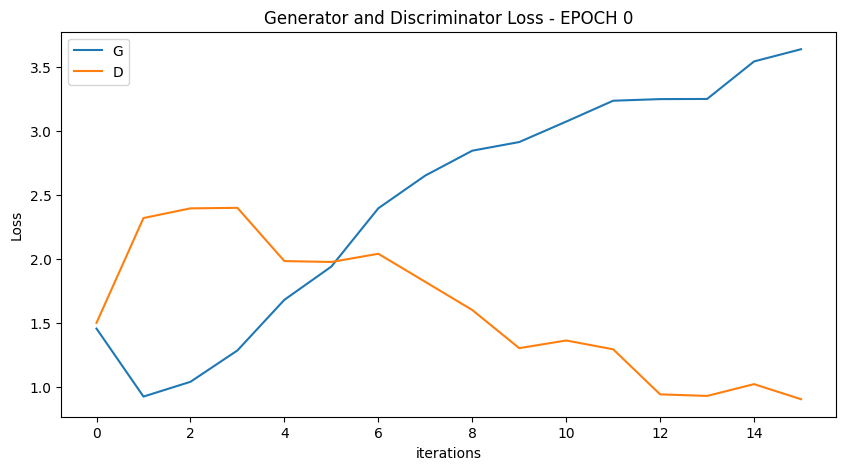

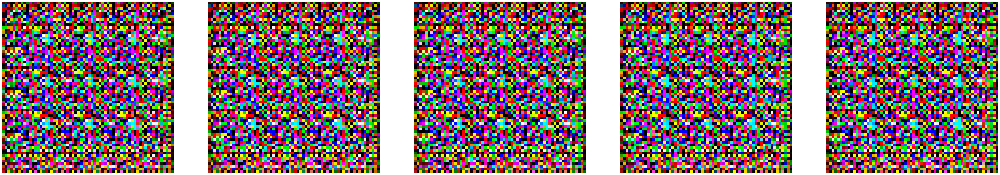

  0%|          | 0/16 [00:00<?, ?it/s]

[2/100][8/16] Loss_D: 0.7144 Loss_G: 3.7799 D(x): 0.7468 D(G(z)): 0.1958 / 0.0152
[2/100][16/16] Loss_D: 0.7056 Loss_G: 4.2889 D(x): 0.6993 D(G(z)): 0.1661 / 0.0087


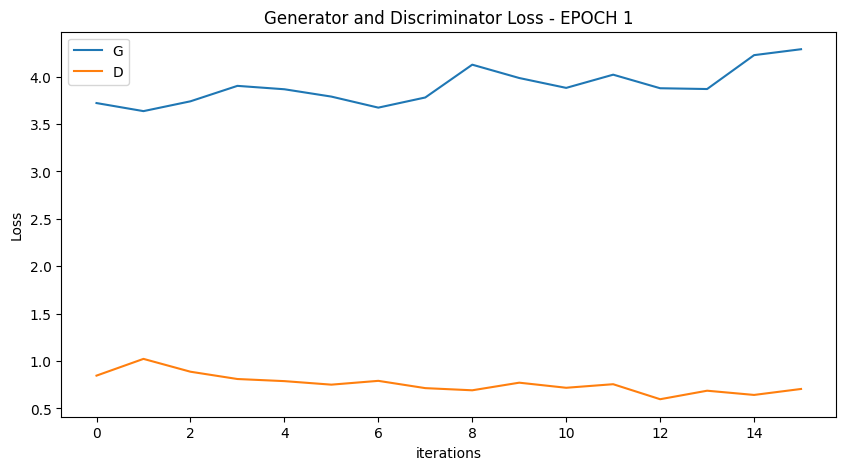

  0%|          | 0/16 [00:00<?, ?it/s]

[3/100][8/16] Loss_D: 0.5294 Loss_G: 4.1456 D(x): 0.7904 D(G(z)): 0.1281 / 0.0105
[3/100][16/16] Loss_D: 0.5159 Loss_G: 3.8696 D(x): 0.7637 D(G(z)): 0.1046 / 0.0138


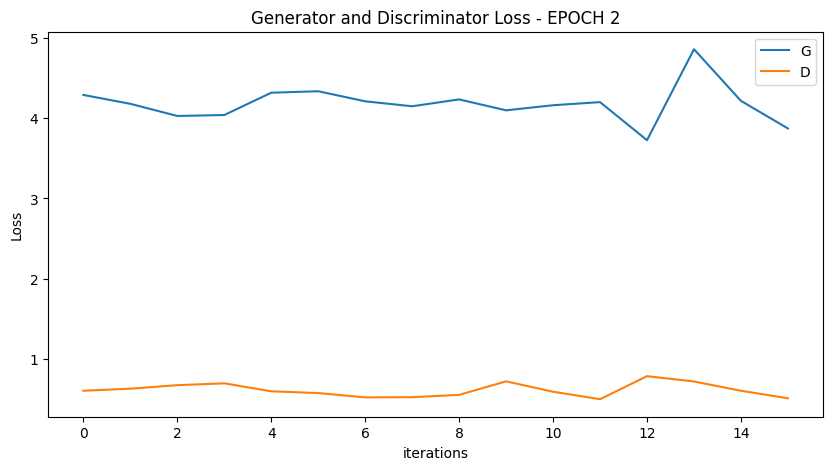

  0%|          | 0/16 [00:00<?, ?it/s]

[4/100][8/16] Loss_D: 0.5387 Loss_G: 4.3414 D(x): 0.7553 D(G(z)): 0.0894 / 0.0082
[4/100][16/16] Loss_D: 0.6896 Loss_G: 2.7135 D(x): 0.6546 D(G(z)): 0.0910 / 0.0566


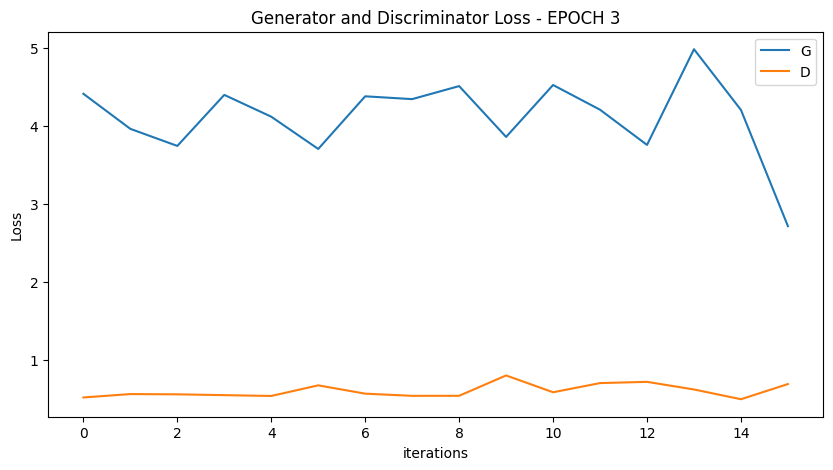

  0%|          | 0/16 [00:00<?, ?it/s]

[5/100][8/16] Loss_D: 0.6544 Loss_G: 3.3791 D(x): 0.6619 D(G(z)): 0.1142 / 0.0242
[5/100][16/16] Loss_D: 1.3321 Loss_G: 2.7349 D(x): 0.5823 D(G(z)): 0.4522 / 0.0502


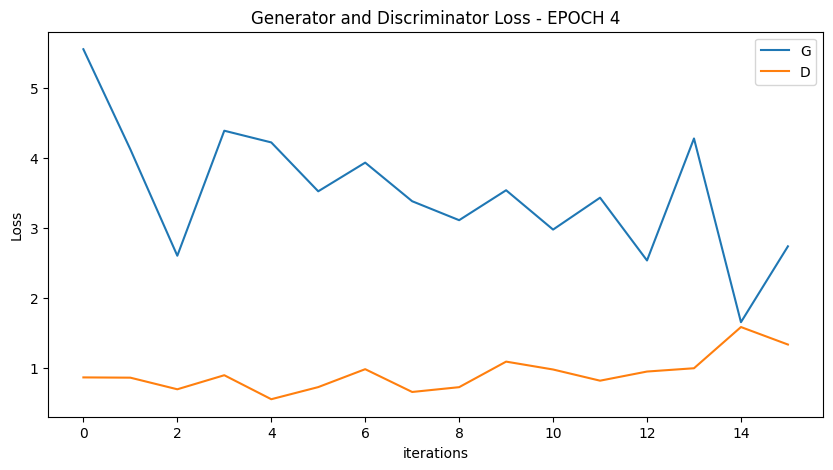

  0%|          | 0/16 [00:00<?, ?it/s]

[6/100][8/16] Loss_D: 0.9489 Loss_G: 1.9674 D(x): 0.6023 D(G(z)): 0.2802 / 0.1172
[6/100][16/16] Loss_D: 1.2127 Loss_G: 1.2690 D(x): 0.3791 D(G(z)): 0.1503 / 0.2614


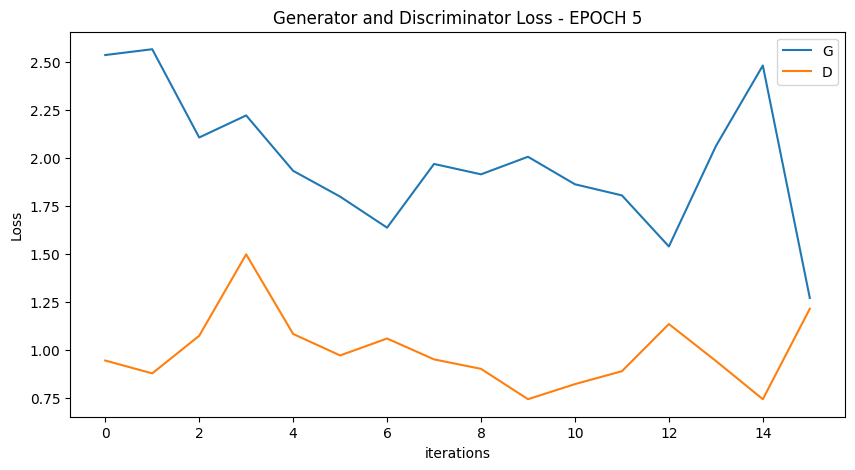

  0%|          | 0/16 [00:00<?, ?it/s]

[7/100][8/16] Loss_D: 0.8502 Loss_G: 1.7297 D(x): 0.5715 D(G(z)): 0.1870 / 0.1592
[7/100][16/16] Loss_D: 0.9168 Loss_G: 1.4782 D(x): 0.4950 D(G(z)): 0.1373 / 0.2042


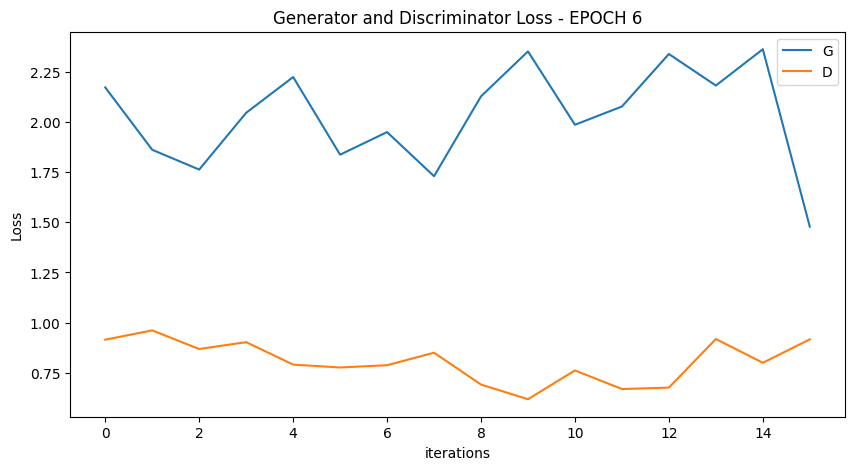

  0%|          | 0/16 [00:00<?, ?it/s]

[8/100][8/16] Loss_D: 0.6864 Loss_G: 2.6402 D(x): 0.7417 D(G(z)): 0.1876 / 0.0605
[8/100][16/16] Loss_D: 0.4476 Loss_G: 3.0707 D(x): 0.7734 D(G(z)): 0.0453 / 0.0406


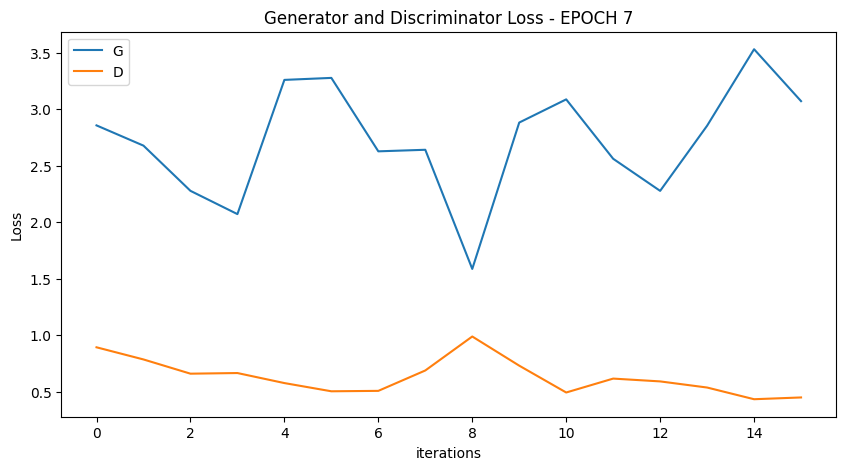

  0%|          | 0/16 [00:00<?, ?it/s]

[9/100][8/16] Loss_D: 0.4113 Loss_G: 3.0790 D(x): 0.8552 D(G(z)): 0.0512 / 0.0357
[9/100][16/16] Loss_D: 0.4751 Loss_G: 2.8630 D(x): 0.7518 D(G(z)): 0.0557 / 0.0462


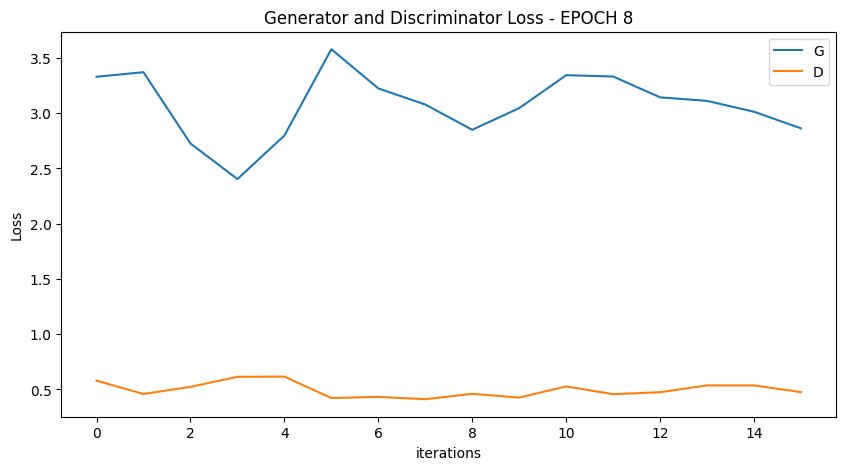

  0%|          | 0/16 [00:00<?, ?it/s]

[10/100][8/16] Loss_D: 0.6220 Loss_G: 2.0354 D(x): 0.6862 D(G(z)): 0.1127 / 0.1116
[10/100][16/16] Loss_D: 0.6822 Loss_G: 2.2766 D(x): 0.6546 D(G(z)): 0.1112 / 0.0935


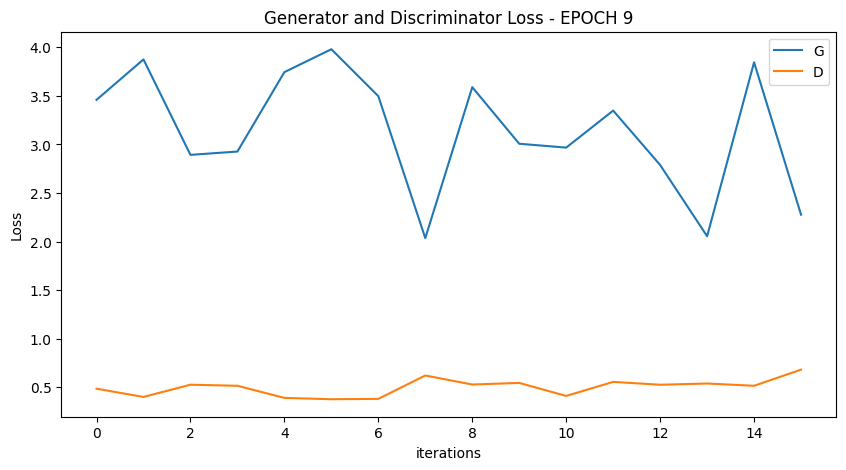

  0%|          | 0/16 [00:00<?, ?it/s]

[11/100][8/16] Loss_D: 0.5298 Loss_G: 2.2373 D(x): 0.7051 D(G(z)): 0.0502 / 0.0874
[11/100][16/16] Loss_D: 0.7788 Loss_G: 4.2961 D(x): 0.7660 D(G(z)): 0.2829 / 0.0124


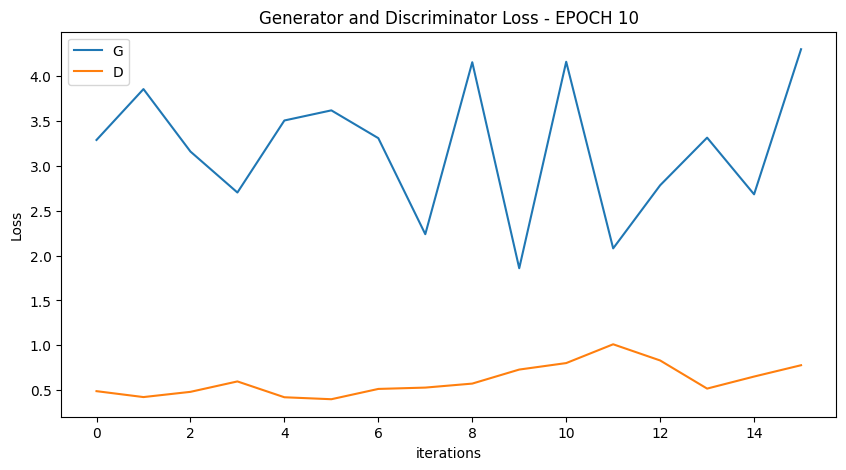

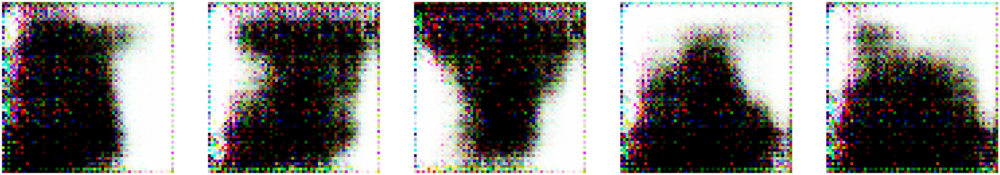

  0%|          | 0/16 [00:00<?, ?it/s]

[12/100][8/16] Loss_D: 0.7614 Loss_G: 2.3695 D(x): 0.7417 D(G(z)): 0.2361 / 0.0907
[12/100][16/16] Loss_D: 1.1054 Loss_G: 3.7534 D(x): 0.6438 D(G(z)): 0.4177 / 0.0186


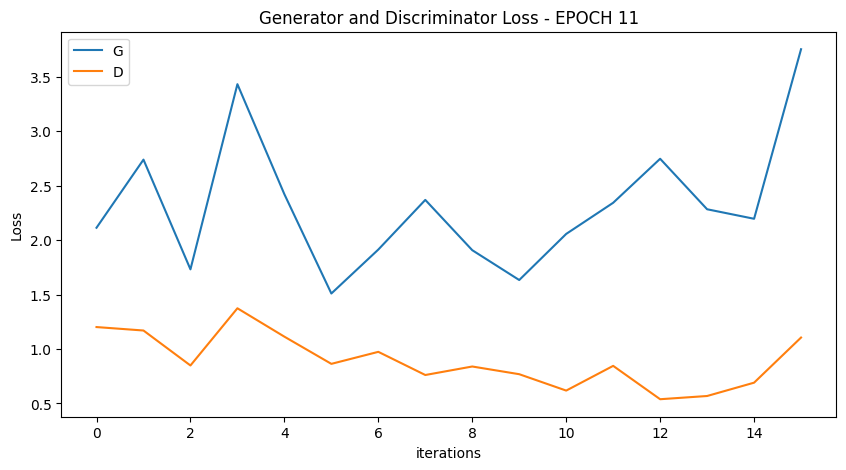

  0%|          | 0/16 [00:00<?, ?it/s]

[13/100][8/16] Loss_D: 1.4352 Loss_G: 3.0131 D(x): 0.8636 D(G(z)): 0.6363 / 0.0602
[13/100][16/16] Loss_D: 0.9680 Loss_G: 1.0917 D(x): 0.5623 D(G(z)): 0.2600 / 0.3274


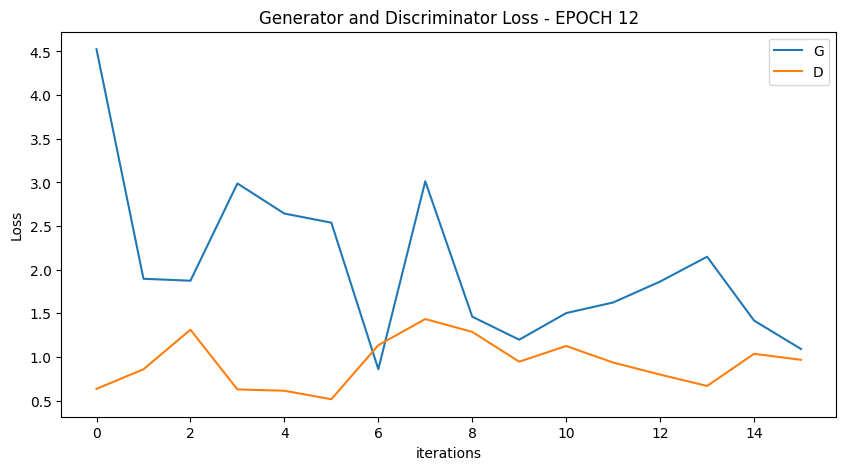

  0%|          | 0/16 [00:00<?, ?it/s]

[14/100][8/16] Loss_D: 0.7699 Loss_G: 2.6789 D(x): 0.7339 D(G(z)): 0.2670 / 0.0596
[14/100][16/16] Loss_D: 1.1502 Loss_G: 1.5783 D(x): 0.5403 D(G(z)): 0.2647 / 0.2111


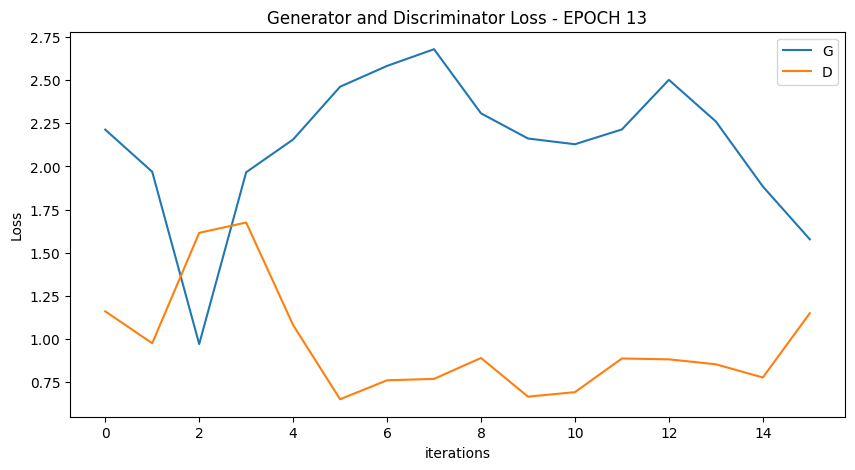

  0%|          | 0/16 [00:00<?, ?it/s]

[15/100][8/16] Loss_D: 1.1242 Loss_G: 1.5000 D(x): 0.5502 D(G(z)): 0.3383 / 0.2235
[15/100][16/16] Loss_D: 1.0038 Loss_G: 1.9107 D(x): 0.7507 D(G(z)): 0.3960 / 0.1682


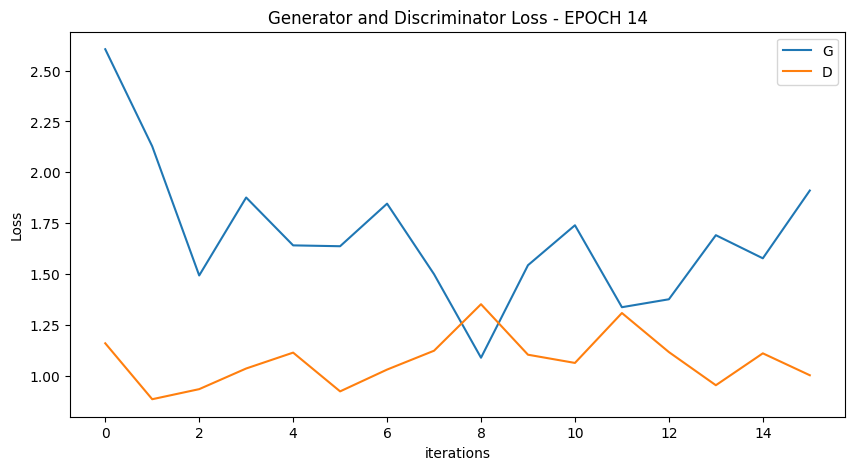

  0%|          | 0/16 [00:00<?, ?it/s]

[16/100][8/16] Loss_D: 1.0986 Loss_G: 1.3843 D(x): 0.6382 D(G(z)): 0.3758 / 0.2510
[16/100][16/16] Loss_D: 1.1678 Loss_G: 1.5745 D(x): 0.5032 D(G(z)): 0.3221 / 0.2323


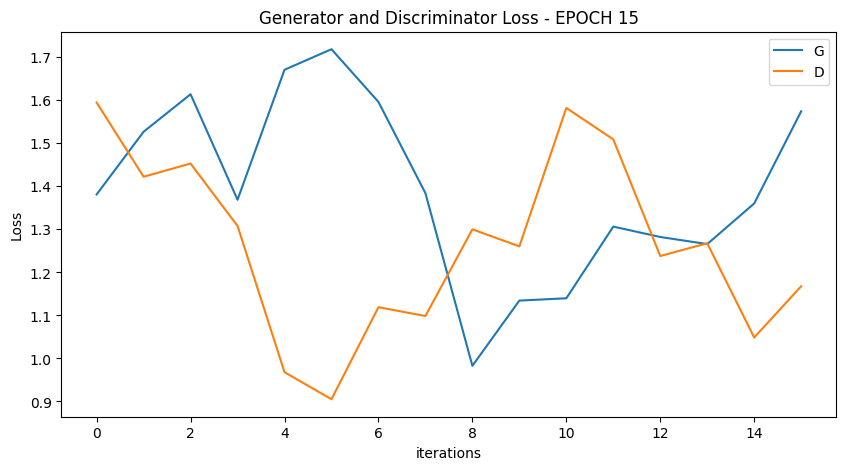

  0%|          | 0/16 [00:00<?, ?it/s]

[17/100][8/16] Loss_D: 1.3042 Loss_G: 1.2765 D(x): 0.4636 D(G(z)): 0.3731 / 0.2635
[17/100][16/16] Loss_D: 1.2430 Loss_G: 1.0177 D(x): 0.4141 D(G(z)): 0.3000 / 0.3453


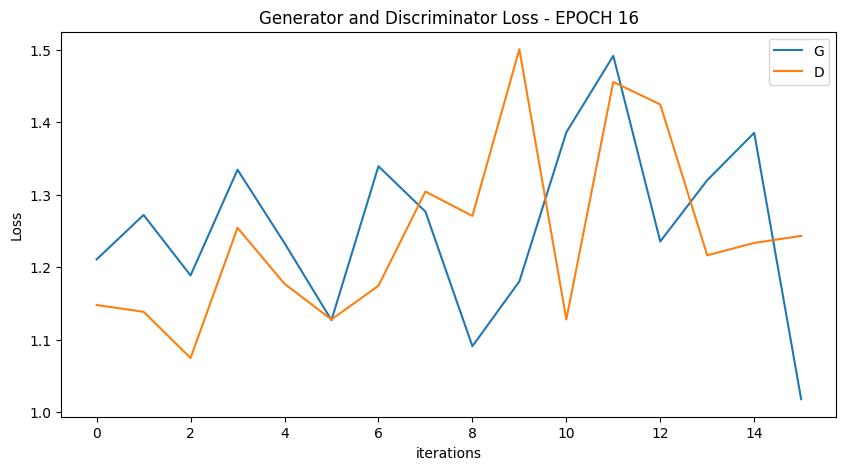

  0%|          | 0/16 [00:00<?, ?it/s]

[18/100][8/16] Loss_D: 1.3116 Loss_G: 1.1378 D(x): 0.5191 D(G(z)): 0.4189 / 0.3162
[18/100][16/16] Loss_D: 1.2353 Loss_G: 1.2375 D(x): 0.5118 D(G(z)): 0.3450 / 0.2764


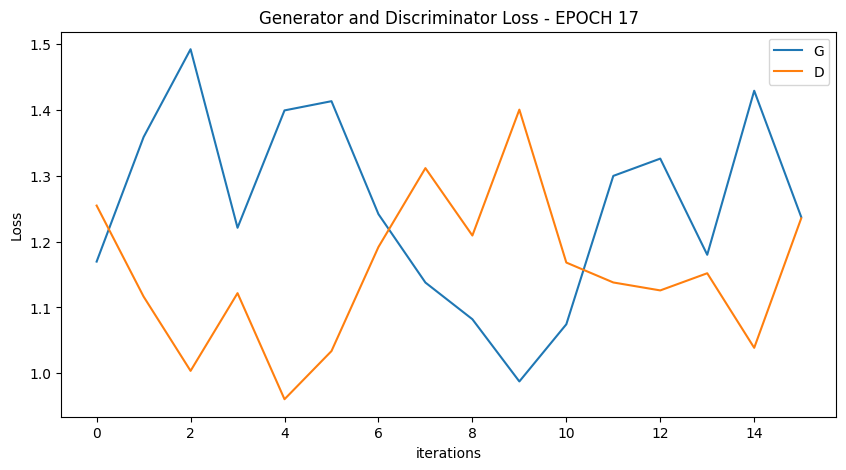

  0%|          | 0/16 [00:00<?, ?it/s]

[19/100][8/16] Loss_D: 0.9250 Loss_G: 1.4251 D(x): 0.5653 D(G(z)): 0.2561 / 0.2254
[19/100][16/16] Loss_D: 1.1485 Loss_G: 1.4923 D(x): 0.5301 D(G(z)): 0.3685 / 0.2108


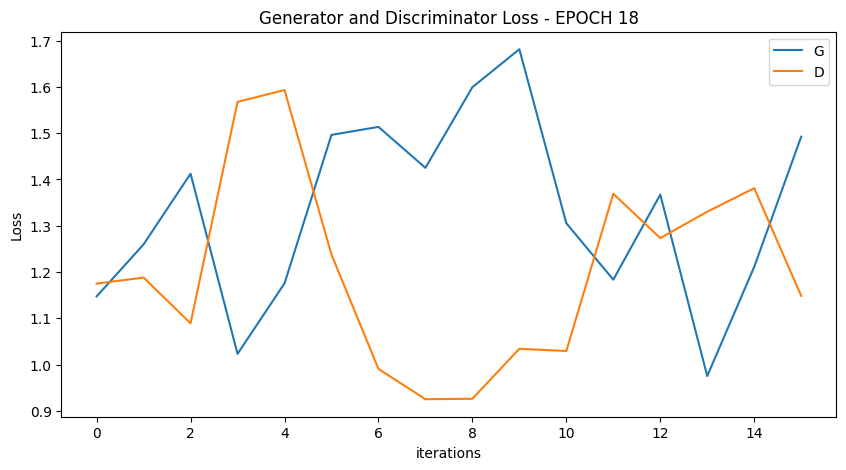

  0%|          | 0/16 [00:00<?, ?it/s]

[20/100][8/16] Loss_D: 0.9403 Loss_G: 1.3945 D(x): 0.5699 D(G(z)): 0.2489 / 0.2342
[20/100][16/16] Loss_D: 0.9523 Loss_G: 1.4428 D(x): 0.6572 D(G(z)): 0.3536 / 0.2205


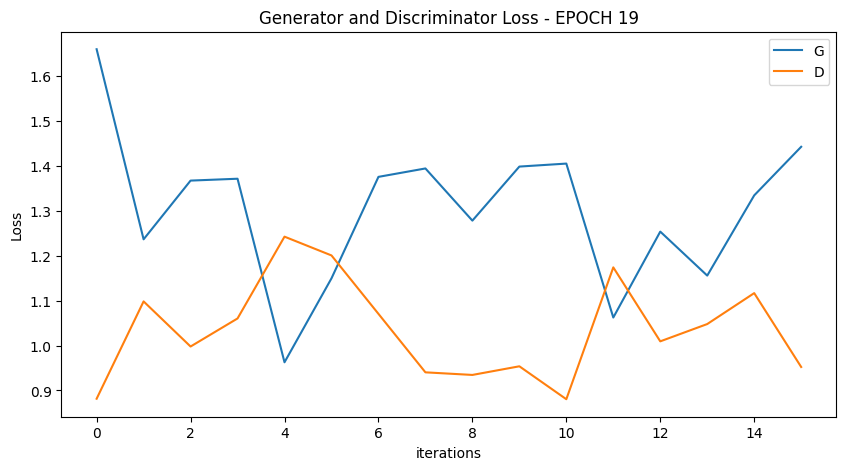

  0%|          | 0/16 [00:00<?, ?it/s]

[21/100][8/16] Loss_D: 1.2244 Loss_G: 1.1704 D(x): 0.4532 D(G(z)): 0.3269 / 0.3102
[21/100][16/16] Loss_D: 1.1248 Loss_G: 1.1629 D(x): 0.4844 D(G(z)): 0.2910 / 0.3144


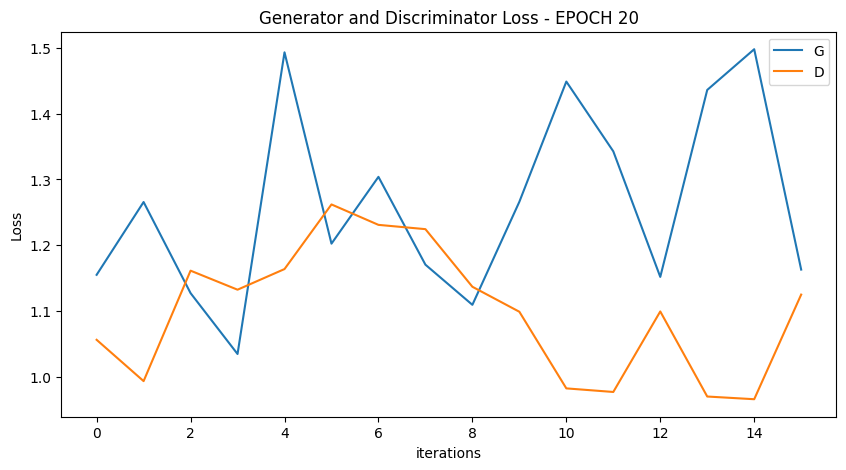

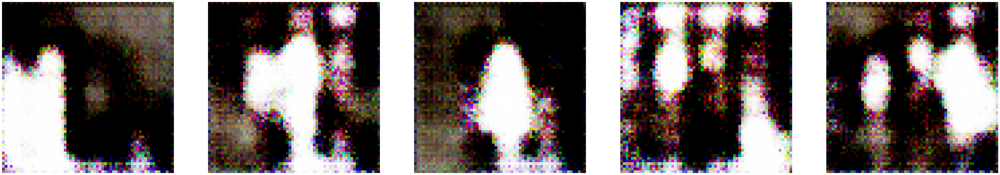

  0%|          | 0/16 [00:00<?, ?it/s]

[22/100][8/16] Loss_D: 1.2208 Loss_G: 1.4352 D(x): 0.5461 D(G(z)): 0.4216 / 0.2199
[22/100][16/16] Loss_D: 1.4059 Loss_G: 1.1146 D(x): 0.4171 D(G(z)): 0.3535 / 0.3250


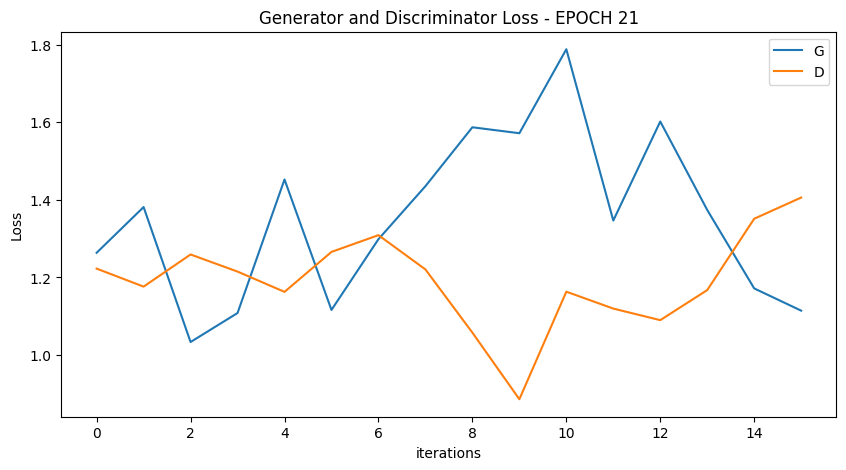

  0%|          | 0/16 [00:00<?, ?it/s]

[23/100][8/16] Loss_D: 1.0592 Loss_G: 1.7645 D(x): 0.5798 D(G(z)): 0.3423 / 0.1691
[23/100][16/16] Loss_D: 1.0086 Loss_G: 1.2789 D(x): 0.5052 D(G(z)): 0.2468 / 0.2593


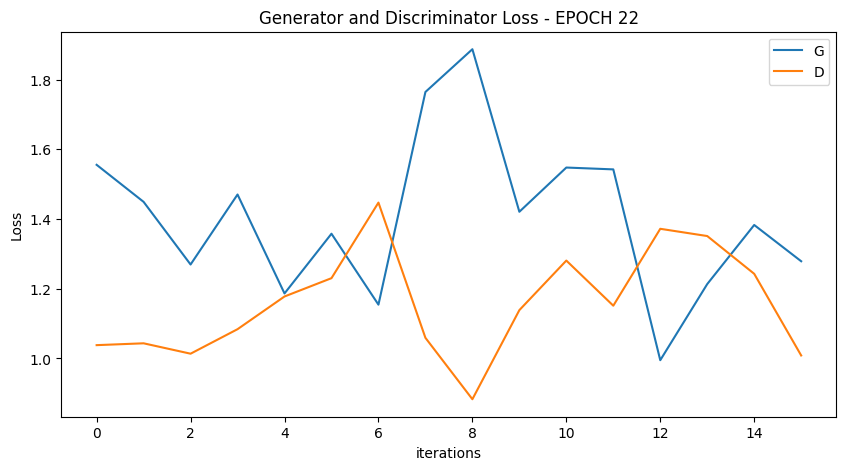

  0%|          | 0/16 [00:00<?, ?it/s]

[24/100][8/16] Loss_D: 1.1314 Loss_G: 1.7941 D(x): 0.7009 D(G(z)): 0.4460 / 0.1560
[24/100][16/16] Loss_D: 1.0581 Loss_G: 1.3752 D(x): 0.4885 D(G(z)): 0.2629 / 0.2520


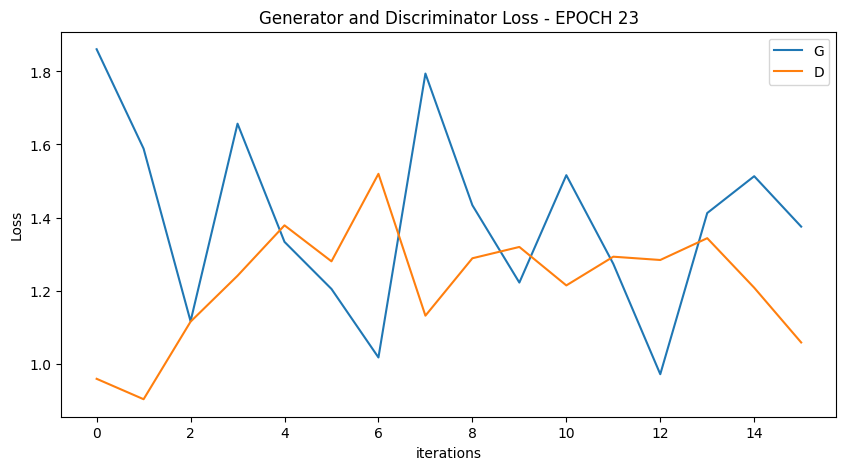

  0%|          | 0/16 [00:00<?, ?it/s]

[25/100][8/16] Loss_D: 1.4308 Loss_G: 1.0999 D(x): 0.3513 D(G(z)): 0.2429 / 0.3415
[25/100][16/16] Loss_D: 1.6449 Loss_G: 1.0587 D(x): 0.4617 D(G(z)): 0.5365 / 0.3383


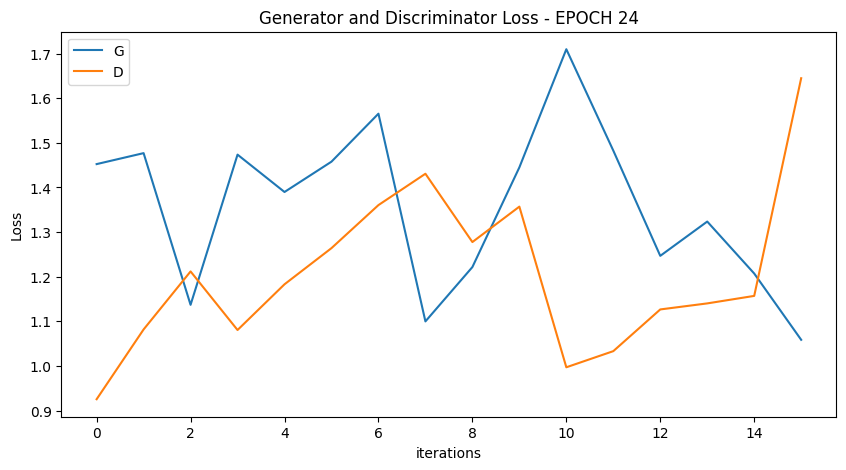

  0%|          | 0/16 [00:00<?, ?it/s]

[26/100][8/16] Loss_D: 1.2538 Loss_G: 1.2153 D(x): 0.4977 D(G(z)): 0.3982 / 0.2919
[26/100][16/16] Loss_D: 1.4143 Loss_G: 1.2368 D(x): 0.4385 D(G(z)): 0.3845 / 0.2824


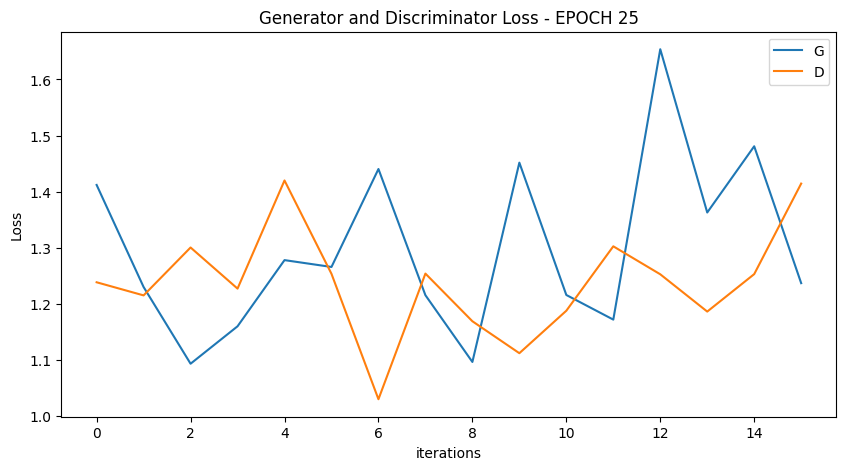

  0%|          | 0/16 [00:00<?, ?it/s]

[27/100][8/16] Loss_D: 1.1856 Loss_G: 1.5115 D(x): 0.5266 D(G(z)): 0.3727 / 0.2107
[27/100][16/16] Loss_D: 1.3928 Loss_G: 1.5314 D(x): 0.7021 D(G(z)): 0.5798 / 0.2080


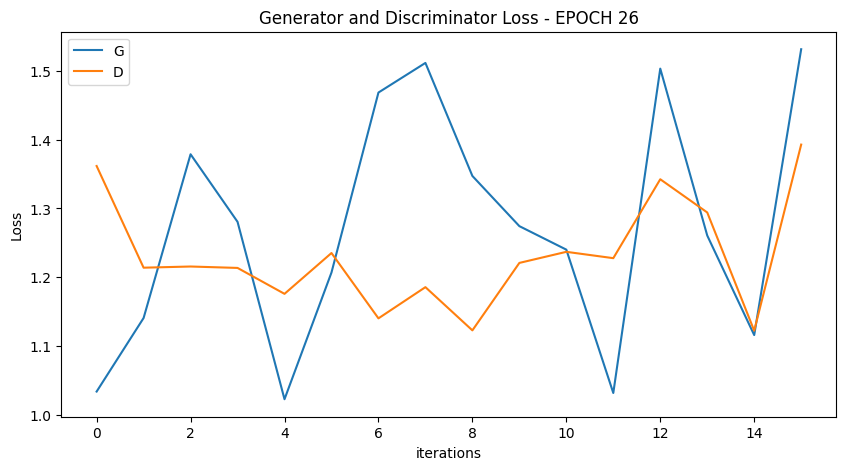

  0%|          | 0/16 [00:00<?, ?it/s]

[28/100][8/16] Loss_D: 1.0702 Loss_G: 1.5155 D(x): 0.5266 D(G(z)): 0.2900 / 0.2026
[28/100][16/16] Loss_D: 1.1950 Loss_G: 1.2908 D(x): 0.5007 D(G(z)): 0.3357 / 0.2800


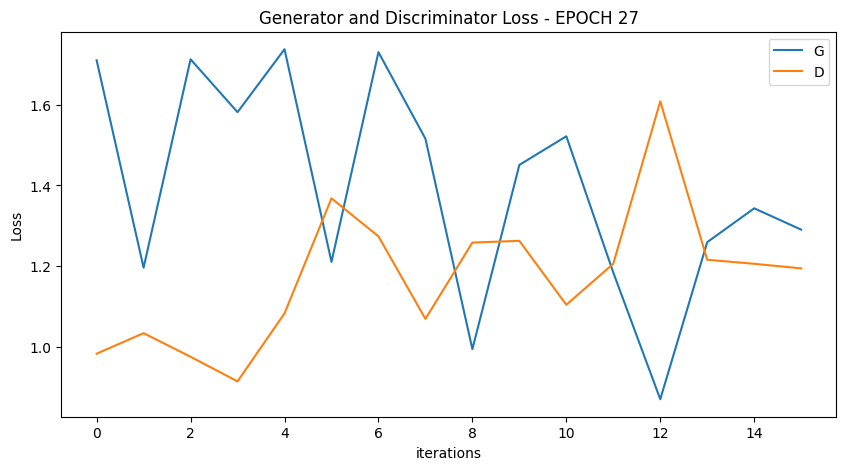

  0%|          | 0/16 [00:00<?, ?it/s]

[29/100][8/16] Loss_D: 1.4708 Loss_G: 1.0028 D(x): 0.5132 D(G(z)): 0.5122 / 0.3596
[29/100][16/16] Loss_D: 1.1768 Loss_G: 1.5681 D(x): 0.4302 D(G(z)): 0.1970 / 0.2023


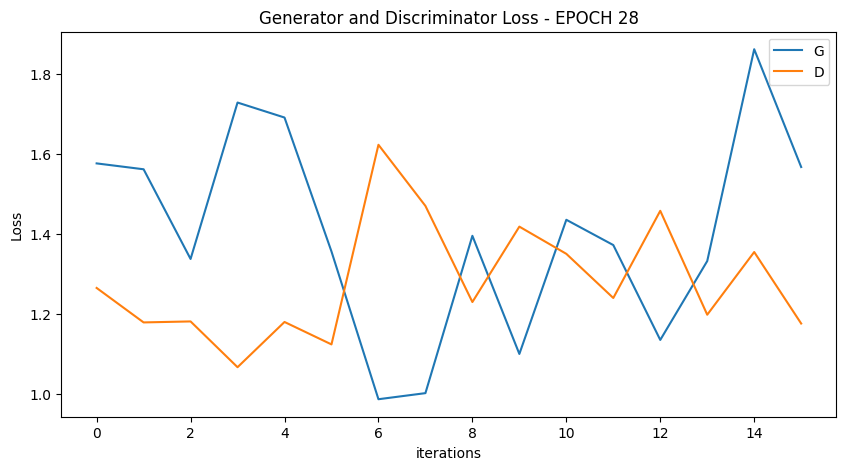

  0%|          | 0/16 [00:00<?, ?it/s]

[30/100][8/16] Loss_D: 1.1910 Loss_G: 1.2952 D(x): 0.6235 D(G(z)): 0.4451 / 0.2574
[30/100][16/16] Loss_D: 1.4738 Loss_G: 2.7871 D(x): 0.6924 D(G(z)): 0.5771 / 0.0642


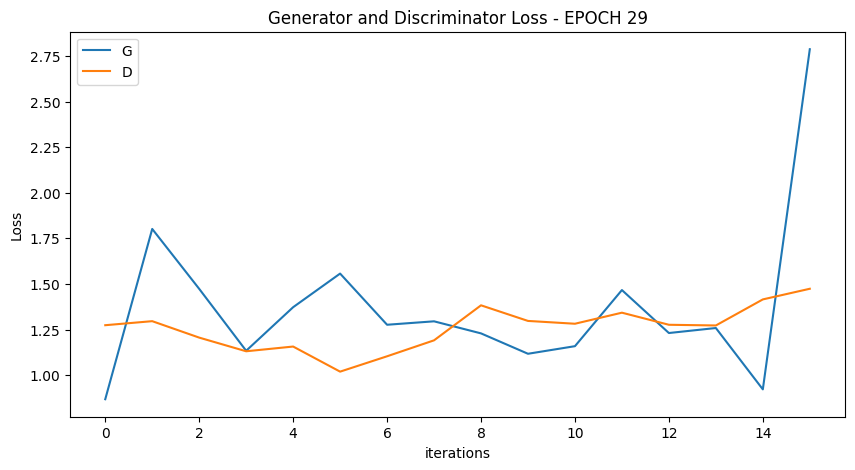

  0%|          | 0/16 [00:00<?, ?it/s]

[31/100][8/16] Loss_D: 1.4209 Loss_G: 1.0244 D(x): 0.4105 D(G(z)): 0.3837 / 0.3523
[31/100][16/16] Loss_D: 1.1423 Loss_G: 1.5638 D(x): 0.5303 D(G(z)): 0.3515 / 0.1894


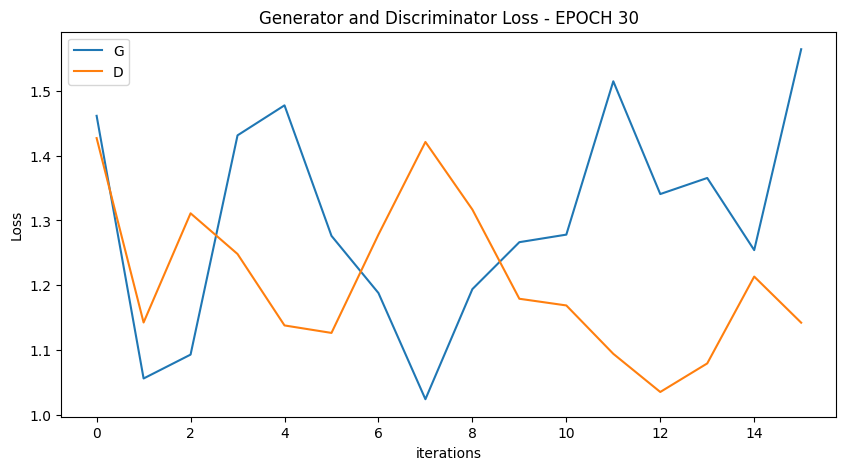

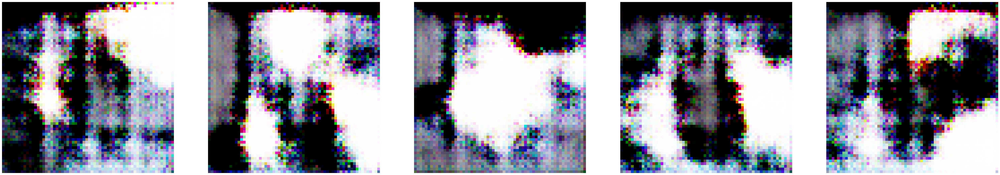

  0%|          | 0/16 [00:00<?, ?it/s]

[32/100][8/16] Loss_D: 1.3378 Loss_G: 1.5860 D(x): 0.6347 D(G(z)): 0.5359 / 0.1908
[32/100][16/16] Loss_D: 1.0664 Loss_G: 1.4286 D(x): 0.6185 D(G(z)): 0.3730 / 0.2179


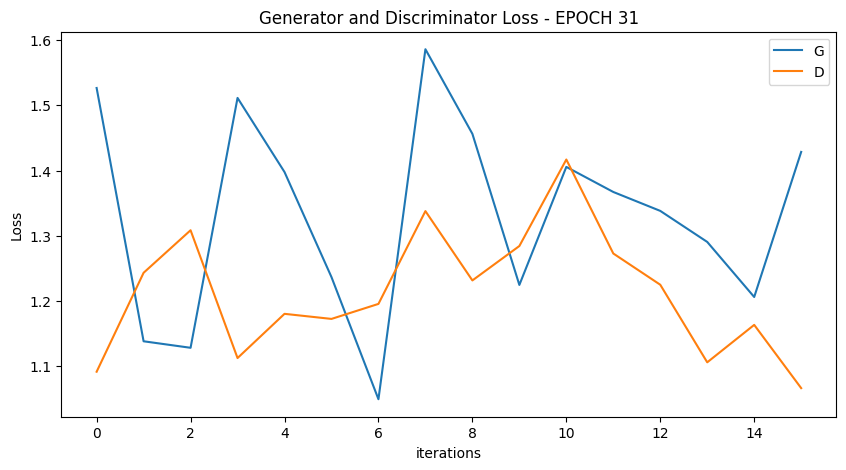

  0%|          | 0/16 [00:00<?, ?it/s]

[33/100][8/16] Loss_D: 1.2600 Loss_G: 1.3786 D(x): 0.4175 D(G(z)): 0.3069 / 0.2323
[33/100][16/16] Loss_D: 1.5751 Loss_G: 1.1376 D(x): 0.3939 D(G(z)): 0.4325 / 0.3067


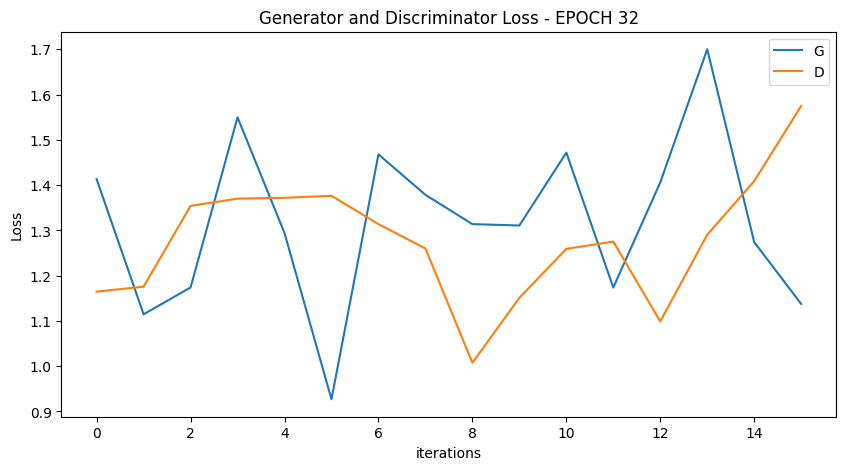

  0%|          | 0/16 [00:00<?, ?it/s]

[34/100][8/16] Loss_D: 1.0242 Loss_G: 1.1419 D(x): 0.5590 D(G(z)): 0.3158 / 0.3041
[34/100][16/16] Loss_D: 0.8102 Loss_G: 1.9204 D(x): 0.6671 D(G(z)): 0.2460 / 0.1290


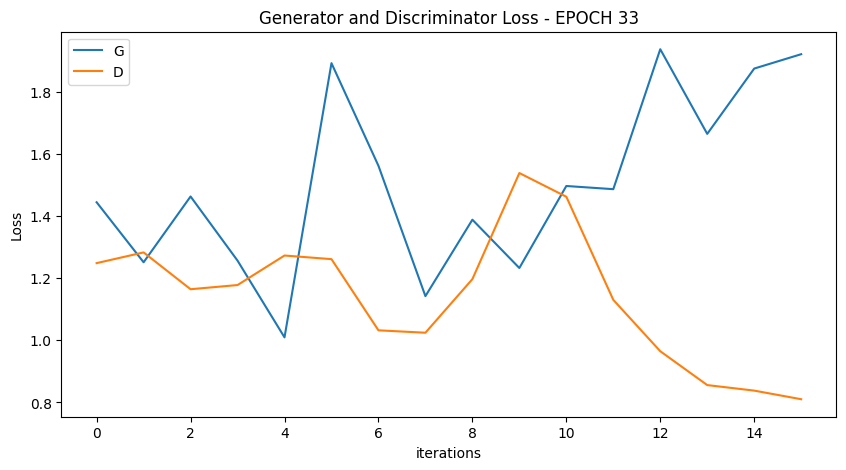

  0%|          | 0/16 [00:00<?, ?it/s]

[35/100][8/16] Loss_D: 1.1434 Loss_G: 1.5562 D(x): 0.5181 D(G(z)): 0.3521 / 0.1924
[35/100][16/16] Loss_D: 1.2367 Loss_G: 1.1134 D(x): 0.4847 D(G(z)): 0.3628 / 0.3233


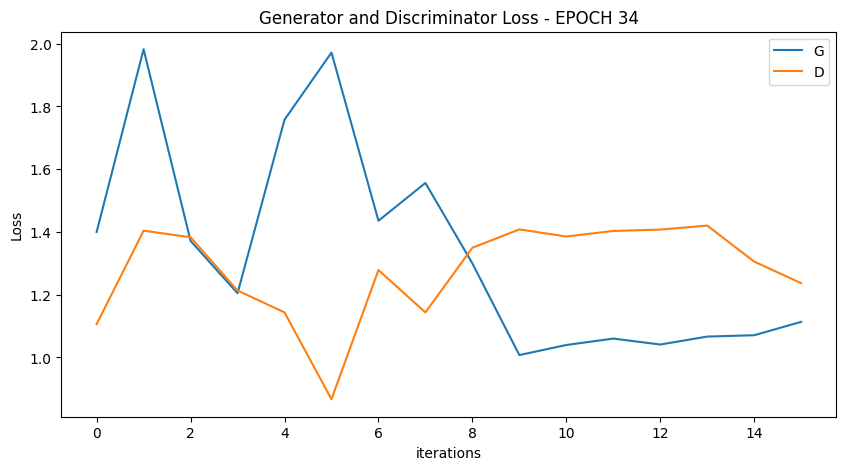

  0%|          | 0/16 [00:00<?, ?it/s]

[36/100][8/16] Loss_D: 1.1677 Loss_G: 1.4958 D(x): 0.6194 D(G(z)): 0.4500 / 0.2003
[36/100][16/16] Loss_D: 1.3049 Loss_G: 1.2148 D(x): 0.4344 D(G(z)): 0.3414 / 0.2912


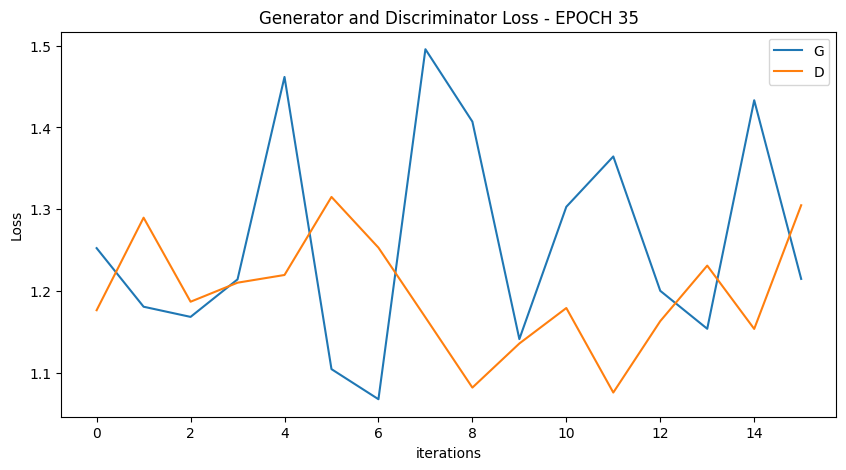

  0%|          | 0/16 [00:00<?, ?it/s]

[37/100][8/16] Loss_D: 1.0561 Loss_G: 1.1641 D(x): 0.5255 D(G(z)): 0.3090 / 0.3014
[37/100][16/16] Loss_D: 1.0528 Loss_G: 1.5955 D(x): 0.5473 D(G(z)): 0.3029 / 0.1816


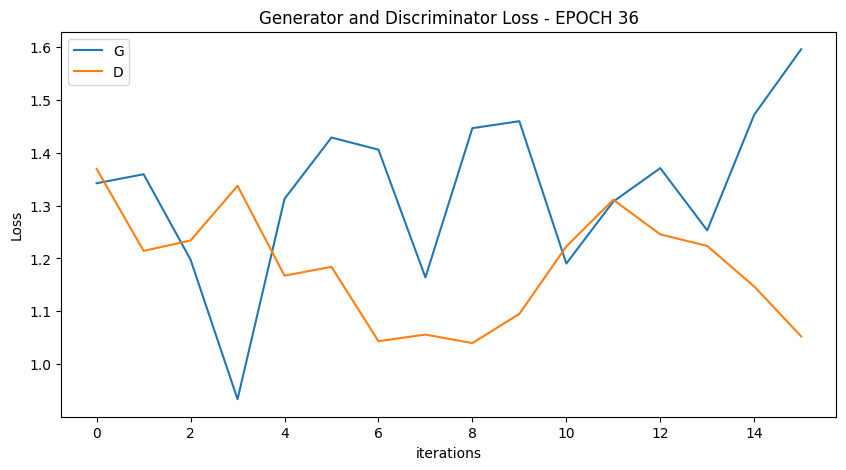

  0%|          | 0/16 [00:00<?, ?it/s]

[38/100][8/16] Loss_D: 1.2579 Loss_G: 0.9851 D(x): 0.4986 D(G(z)): 0.3947 / 0.3661
[38/100][16/16] Loss_D: 1.3470 Loss_G: 1.2114 D(x): 0.5131 D(G(z)): 0.4681 / 0.2738


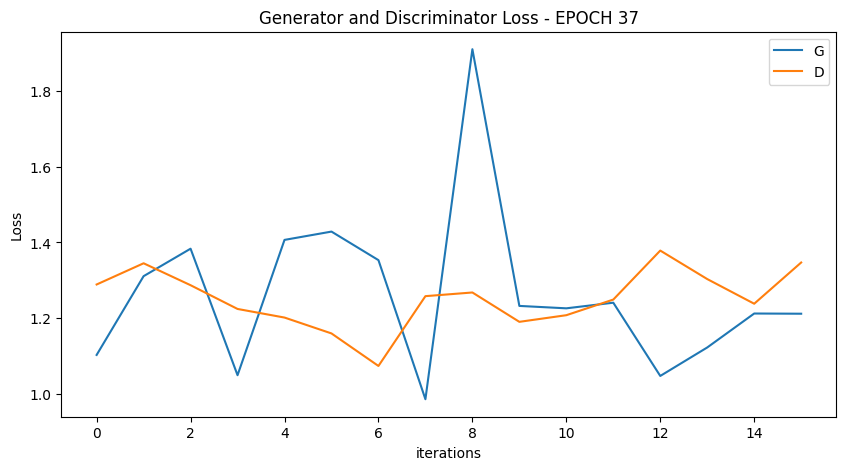

  0%|          | 0/16 [00:00<?, ?it/s]

[39/100][8/16] Loss_D: 1.1765 Loss_G: 1.1250 D(x): 0.4606 D(G(z)): 0.3099 / 0.3275
[39/100][16/16] Loss_D: 1.1775 Loss_G: 1.4430 D(x): 0.5209 D(G(z)): 0.3637 / 0.2177


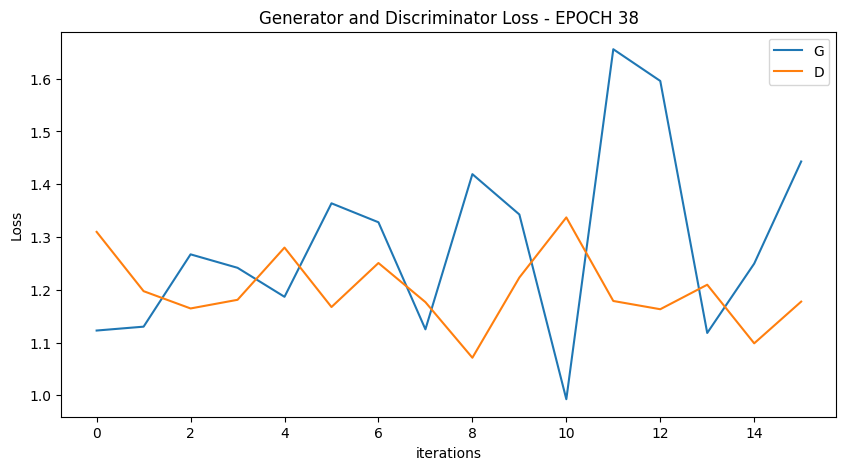

  0%|          | 0/16 [00:00<?, ?it/s]

[40/100][8/16] Loss_D: 1.1421 Loss_G: 1.4565 D(x): 0.4100 D(G(z)): 0.2078 / 0.2108
[40/100][16/16] Loss_D: 0.8994 Loss_G: 1.5571 D(x): 0.6108 D(G(z)): 0.2592 / 0.1965


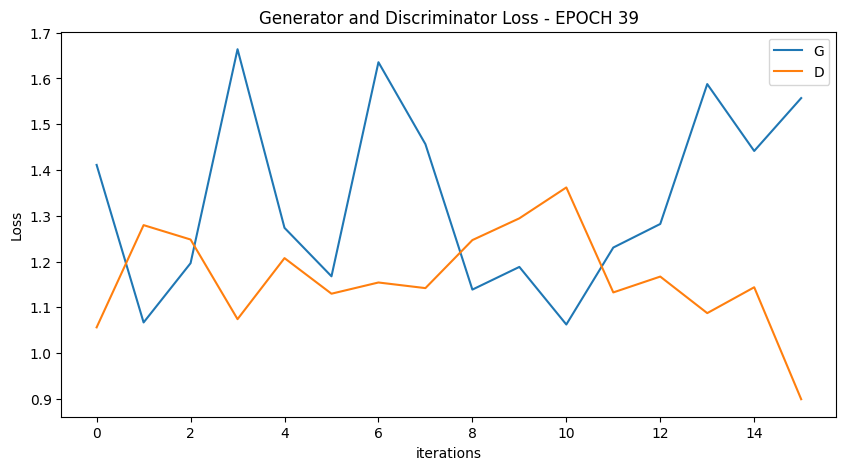

  0%|          | 0/16 [00:00<?, ?it/s]

[41/100][8/16] Loss_D: 1.3347 Loss_G: 1.1046 D(x): 0.4530 D(G(z)): 0.3932 / 0.3142
[41/100][16/16] Loss_D: 1.1350 Loss_G: 1.3853 D(x): 0.4943 D(G(z)): 0.3174 / 0.2335


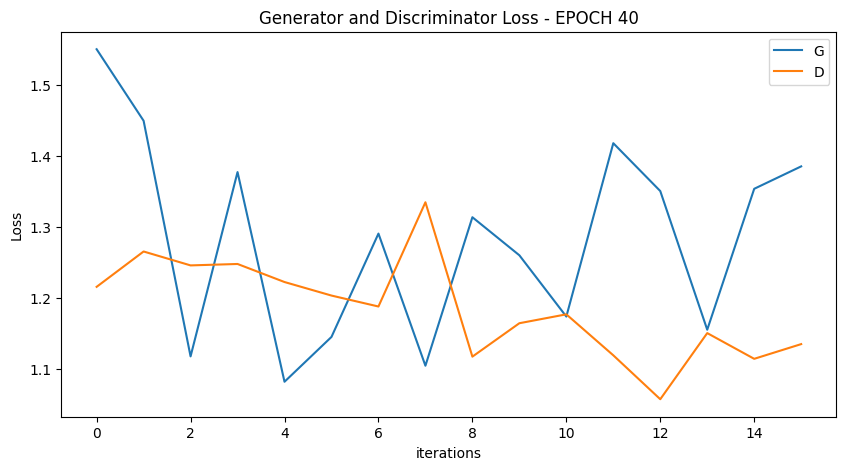

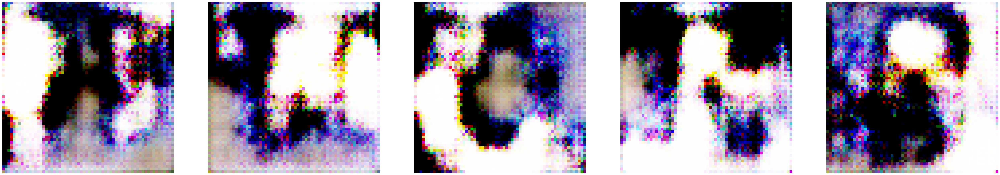

  0%|          | 0/16 [00:00<?, ?it/s]

[42/100][8/16] Loss_D: 1.1852 Loss_G: 1.4995 D(x): 0.4102 D(G(z)): 0.2349 / 0.2112
[42/100][16/16] Loss_D: 1.2136 Loss_G: 1.2360 D(x): 0.3871 D(G(z)): 0.2172 / 0.2753


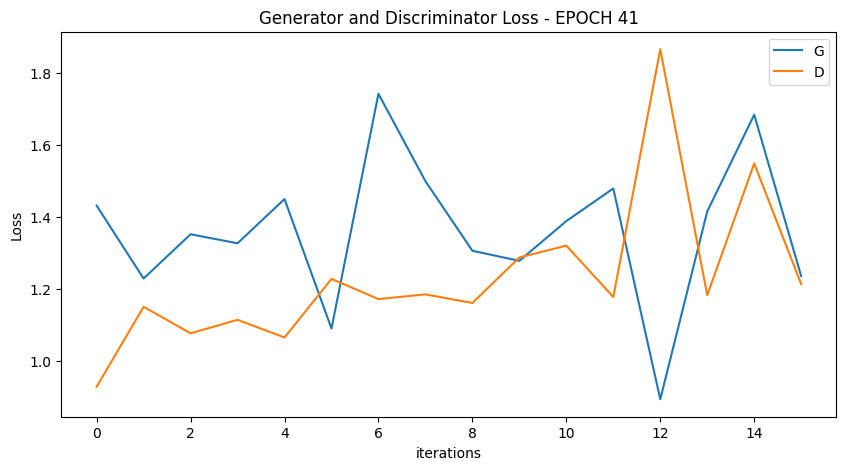

  0%|          | 0/16 [00:00<?, ?it/s]

[43/100][8/16] Loss_D: 1.0389 Loss_G: 1.2998 D(x): 0.5228 D(G(z)): 0.2925 / 0.2607
[43/100][16/16] Loss_D: 1.0080 Loss_G: 1.0381 D(x): 0.5202 D(G(z)): 0.2726 / 0.3576


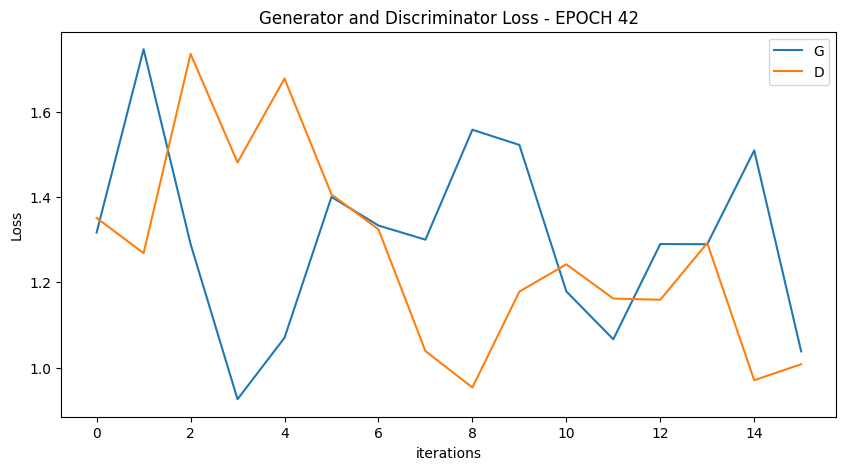

  0%|          | 0/16 [00:00<?, ?it/s]

[44/100][8/16] Loss_D: 1.2041 Loss_G: 1.5960 D(x): 0.5522 D(G(z)): 0.4100 / 0.1863
[44/100][16/16] Loss_D: 1.2745 Loss_G: 1.2338 D(x): 0.4599 D(G(z)): 0.3446 / 0.2818


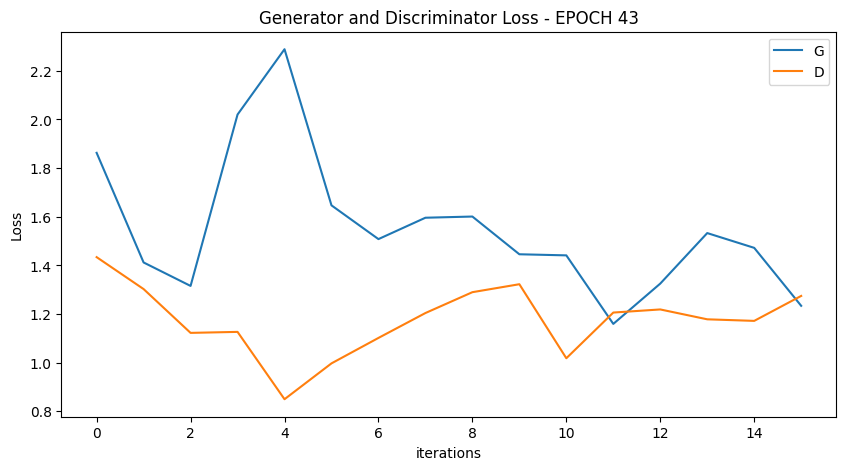

  0%|          | 0/16 [00:00<?, ?it/s]

[45/100][8/16] Loss_D: 1.1517 Loss_G: 1.2125 D(x): 0.5489 D(G(z)): 0.3628 / 0.2862
[45/100][16/16] Loss_D: 0.8577 Loss_G: 1.7974 D(x): 0.6459 D(G(z)): 0.2705 / 0.1548


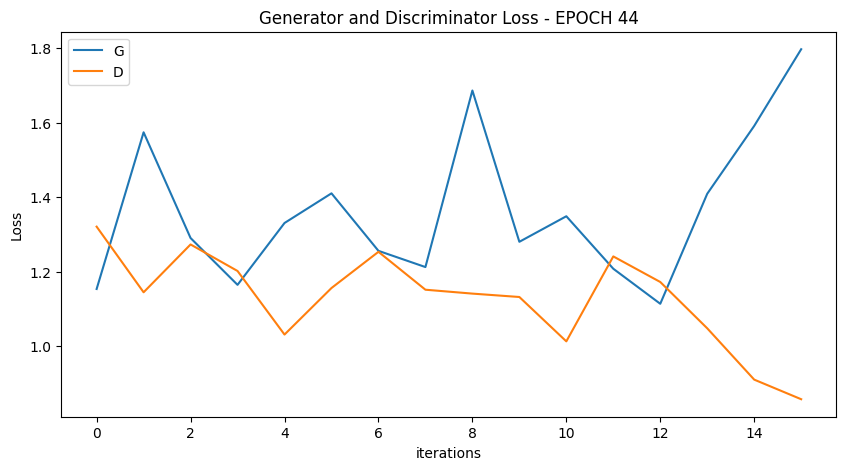

  0%|          | 0/16 [00:00<?, ?it/s]

[46/100][8/16] Loss_D: 1.2090 Loss_G: 1.1765 D(x): 0.4599 D(G(z)): 0.3116 / 0.2968
[46/100][16/16] Loss_D: 1.1768 Loss_G: 1.2557 D(x): 0.5531 D(G(z)): 0.4070 / 0.2675


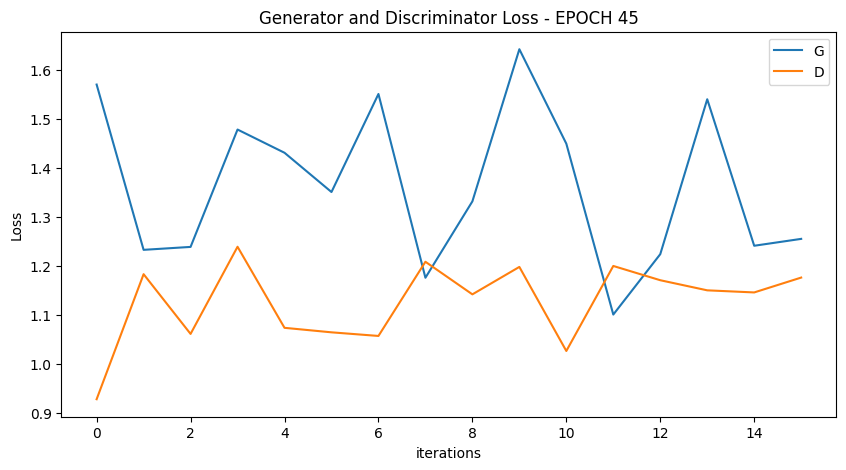

  0%|          | 0/16 [00:00<?, ?it/s]

[47/100][8/16] Loss_D: 1.0889 Loss_G: 1.3262 D(x): 0.5775 D(G(z)): 0.3686 / 0.2515
[47/100][16/16] Loss_D: 0.9072 Loss_G: 1.7557 D(x): 0.6172 D(G(z)): 0.2961 / 0.1590


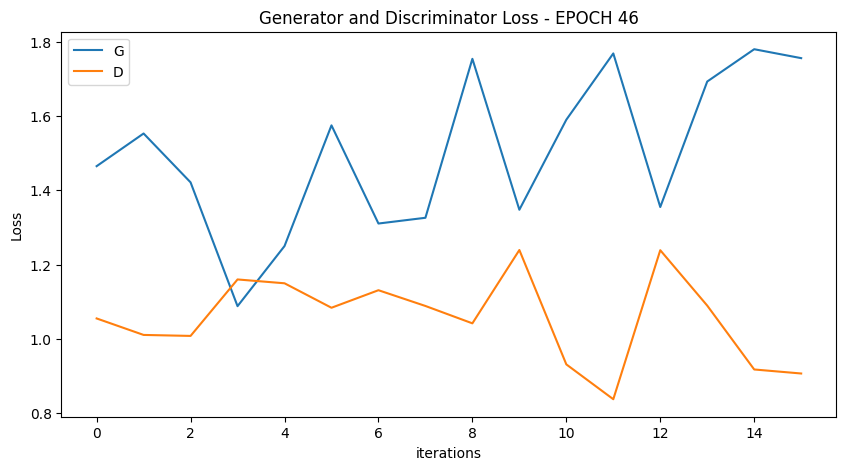

  0%|          | 0/16 [00:00<?, ?it/s]

[48/100][8/16] Loss_D: 1.1841 Loss_G: 1.5509 D(x): 0.5124 D(G(z)): 0.3466 / 0.1953
[48/100][16/16] Loss_D: 1.2153 Loss_G: 1.5180 D(x): 0.4420 D(G(z)): 0.2857 / 0.2007


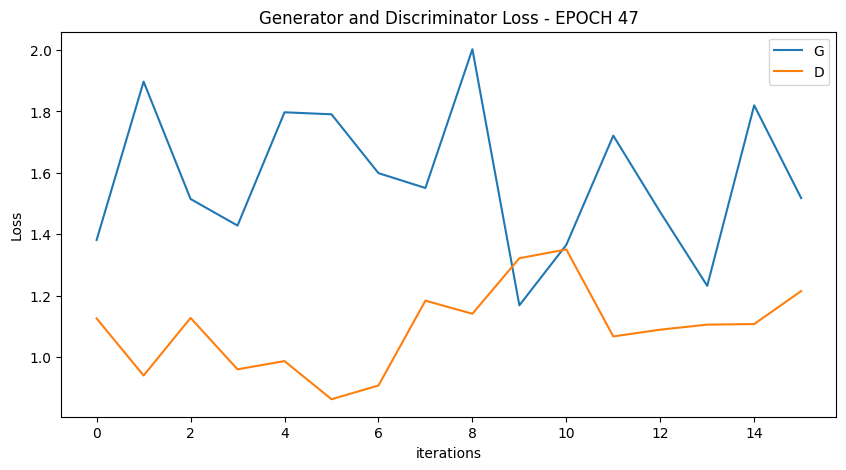

  0%|          | 0/16 [00:00<?, ?it/s]

[49/100][8/16] Loss_D: 1.1143 Loss_G: 1.3551 D(x): 0.5624 D(G(z)): 0.3703 / 0.2524
[49/100][16/16] Loss_D: 1.0703 Loss_G: 1.6160 D(x): 0.6497 D(G(z)): 0.3929 / 0.1905


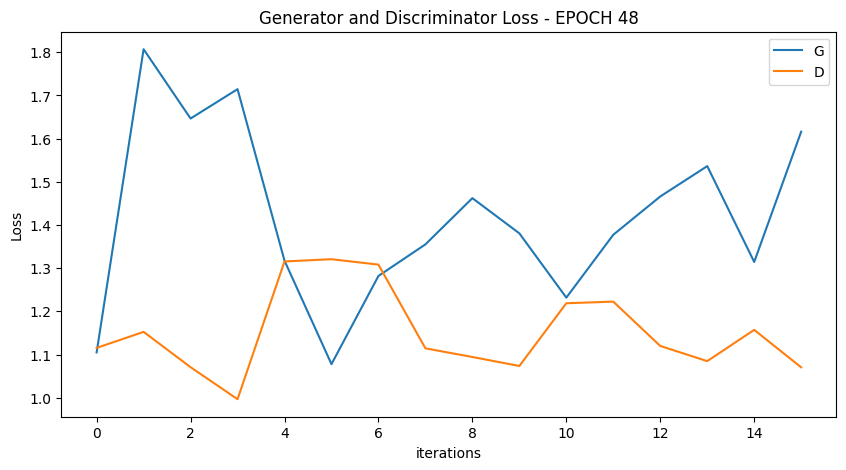

  0%|          | 0/16 [00:00<?, ?it/s]

[50/100][8/16] Loss_D: 1.3313 Loss_G: 1.3066 D(x): 0.5585 D(G(z)): 0.4704 / 0.2660
[50/100][16/16] Loss_D: 1.3427 Loss_G: 1.3927 D(x): 0.4490 D(G(z)): 0.3754 / 0.2390


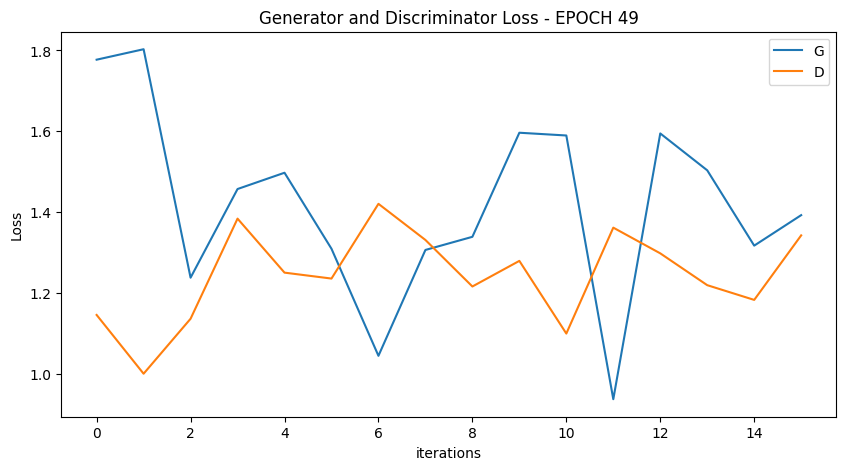

  0%|          | 0/16 [00:00<?, ?it/s]

[51/100][8/16] Loss_D: 1.1391 Loss_G: 1.5440 D(x): 0.5632 D(G(z)): 0.3703 / 0.2011
[51/100][16/16] Loss_D: 1.2528 Loss_G: 2.0260 D(x): 0.5853 D(G(z)): 0.4626 / 0.1221


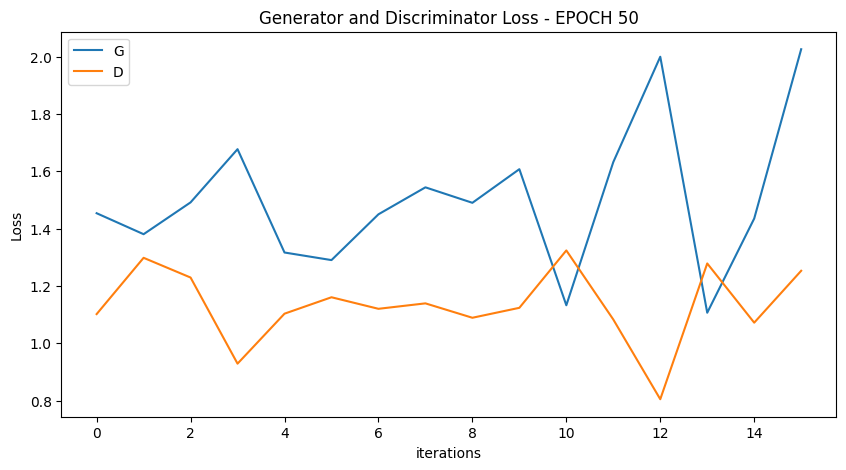

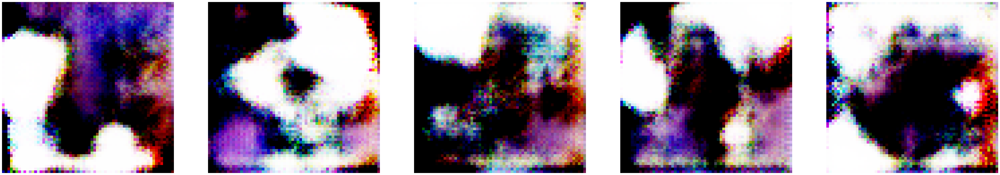

  0%|          | 0/16 [00:00<?, ?it/s]

[52/100][8/16] Loss_D: 1.1084 Loss_G: 1.3932 D(x): 0.6346 D(G(z)): 0.4199 / 0.2326
[52/100][16/16] Loss_D: 1.4529 Loss_G: 0.9130 D(x): 0.3580 D(G(z)): 0.3399 / 0.4042


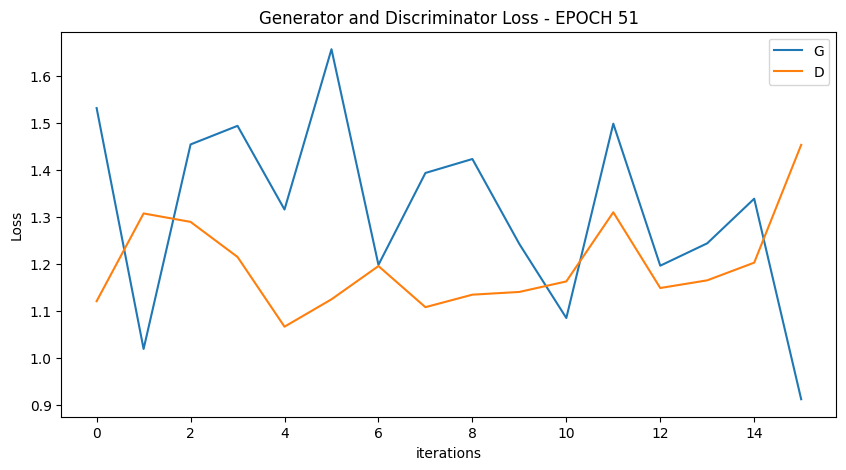

  0%|          | 0/16 [00:00<?, ?it/s]

[53/100][8/16] Loss_D: 1.0339 Loss_G: 1.7781 D(x): 0.6158 D(G(z)): 0.3582 / 0.1528
[53/100][16/16] Loss_D: 1.1032 Loss_G: 1.1652 D(x): 0.4614 D(G(z)): 0.1973 / 0.2978


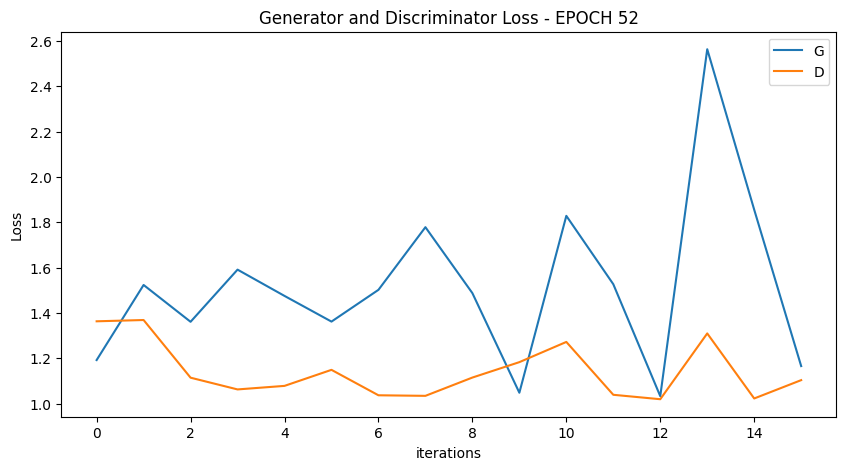

  0%|          | 0/16 [00:00<?, ?it/s]

[54/100][8/16] Loss_D: 0.8933 Loss_G: 1.3659 D(x): 0.6390 D(G(z)): 0.2955 / 0.2388
[54/100][16/16] Loss_D: 1.3499 Loss_G: 0.9273 D(x): 0.3534 D(G(z)): 0.2801 / 0.4096


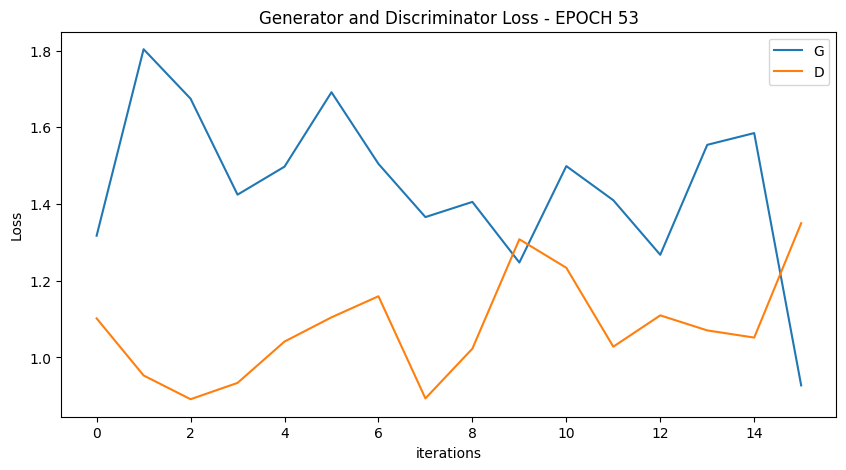

  0%|          | 0/16 [00:00<?, ?it/s]

[55/100][8/16] Loss_D: 1.1986 Loss_G: 1.4120 D(x): 0.5402 D(G(z)): 0.3854 / 0.2311
[55/100][16/16] Loss_D: 1.0280 Loss_G: 1.5641 D(x): 0.6799 D(G(z)): 0.3979 / 0.2041


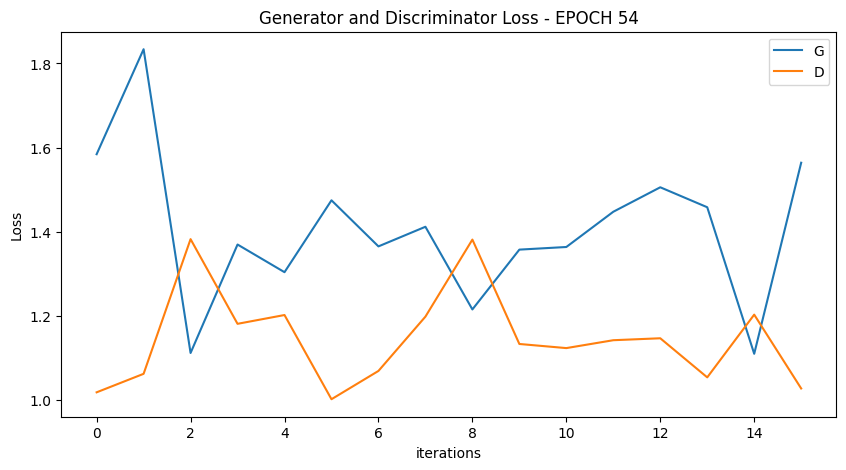

  0%|          | 0/16 [00:00<?, ?it/s]

[56/100][8/16] Loss_D: 0.9134 Loss_G: 1.6096 D(x): 0.6431 D(G(z)): 0.2992 / 0.1894
[56/100][16/16] Loss_D: 1.1680 Loss_G: 1.3953 D(x): 0.5408 D(G(z)): 0.3820 / 0.2352


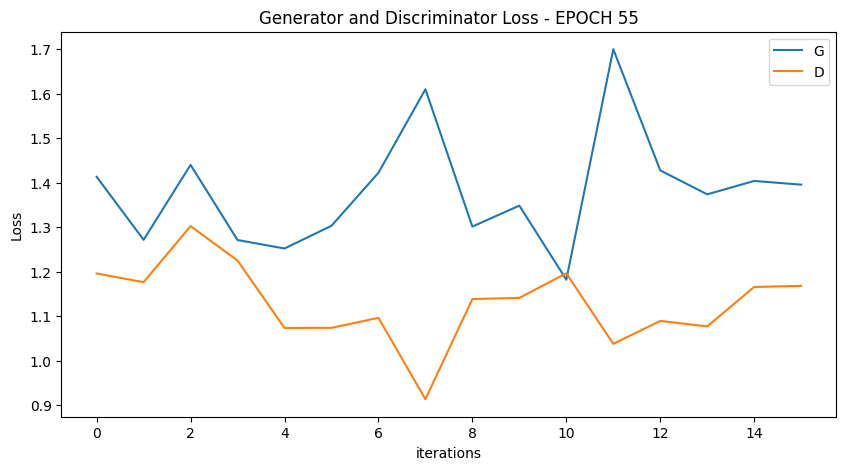

  0%|          | 0/16 [00:00<?, ?it/s]

[57/100][8/16] Loss_D: 1.2371 Loss_G: 1.2210 D(x): 0.4670 D(G(z)): 0.3257 / 0.2874
[57/100][16/16] Loss_D: 1.1408 Loss_G: 1.4549 D(x): 0.6003 D(G(z)): 0.4030 / 0.2154


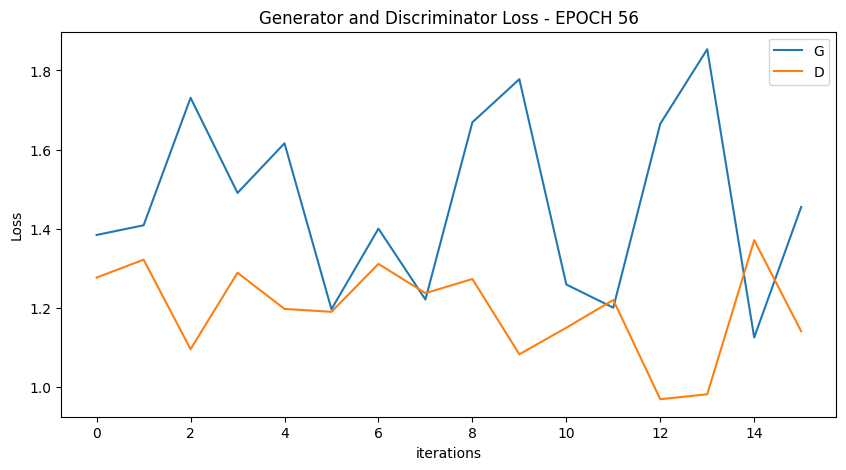

  0%|          | 0/16 [00:00<?, ?it/s]

[58/100][8/16] Loss_D: 1.4240 Loss_G: 0.9837 D(x): 0.3375 D(G(z)): 0.2691 / 0.3912
[58/100][16/16] Loss_D: 1.2119 Loss_G: 1.3776 D(x): 0.4261 D(G(z)): 0.2377 / 0.2385


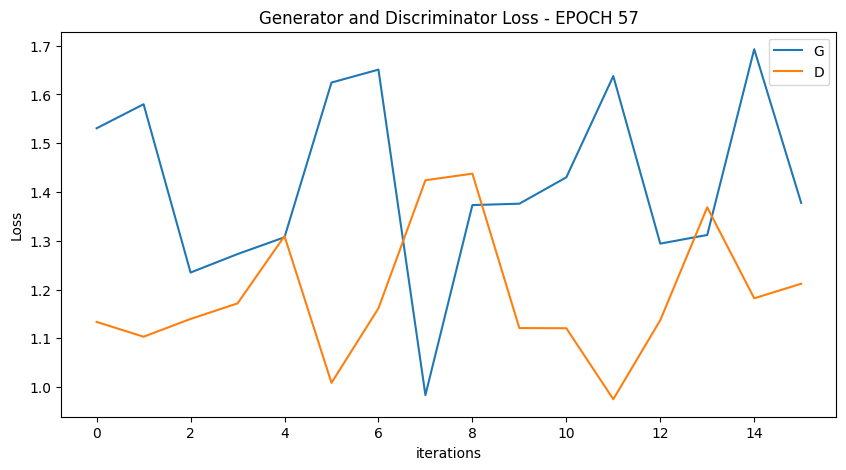

  0%|          | 0/16 [00:00<?, ?it/s]

[59/100][8/16] Loss_D: 0.9833 Loss_G: 1.7065 D(x): 0.6362 D(G(z)): 0.3497 / 0.1690
[59/100][16/16] Loss_D: 1.4197 Loss_G: 0.9792 D(x): 0.3646 D(G(z)): 0.3007 / 0.3771


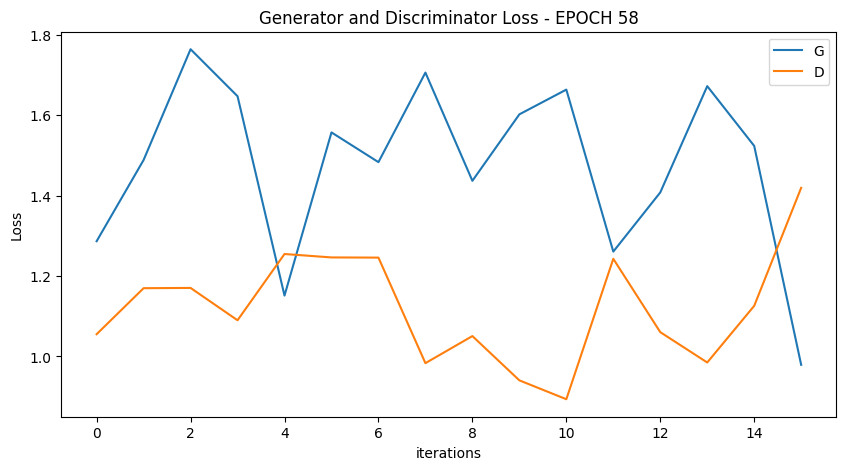

  0%|          | 0/16 [00:00<?, ?it/s]

[60/100][8/16] Loss_D: 1.1968 Loss_G: 1.2375 D(x): 0.6319 D(G(z)): 0.4557 / 0.2853
[60/100][16/16] Loss_D: 1.0707 Loss_G: 1.6256 D(x): 0.4691 D(G(z)): 0.2089 / 0.1863


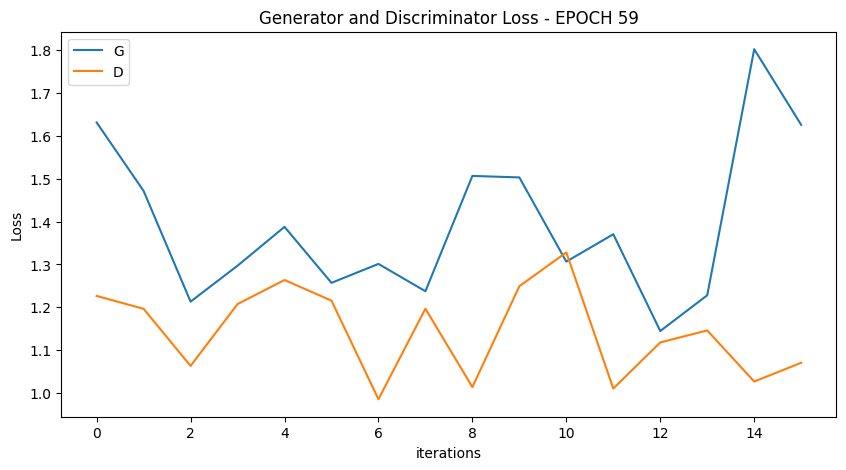

  0%|          | 0/16 [00:00<?, ?it/s]

[61/100][8/16] Loss_D: 1.1999 Loss_G: 1.2442 D(x): 0.4214 D(G(z)): 0.2687 / 0.2907
[61/100][16/16] Loss_D: 1.0209 Loss_G: 1.5985 D(x): 0.4994 D(G(z)): 0.2468 / 0.1820


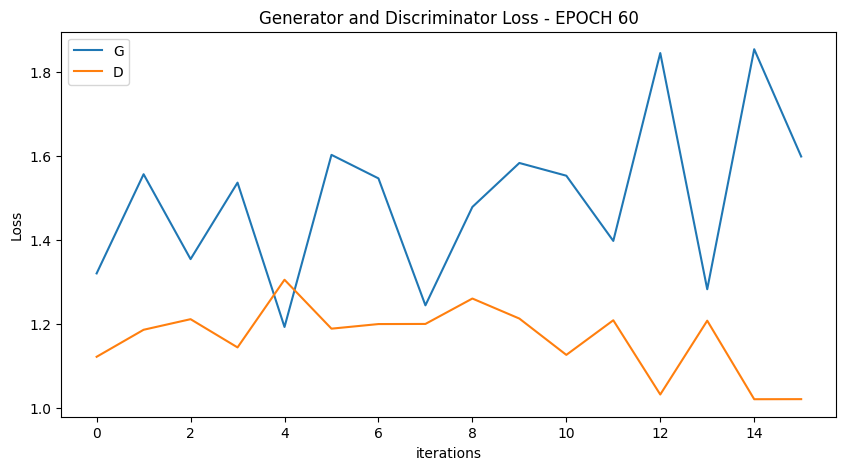

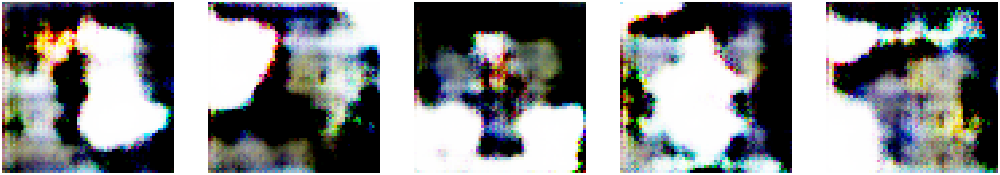

  0%|          | 0/16 [00:00<?, ?it/s]

[62/100][8/16] Loss_D: 1.0475 Loss_G: 1.2677 D(x): 0.6116 D(G(z)): 0.3785 / 0.2699
[62/100][16/16] Loss_D: 1.0562 Loss_G: 1.4123 D(x): 0.5246 D(G(z)): 0.2806 / 0.2293


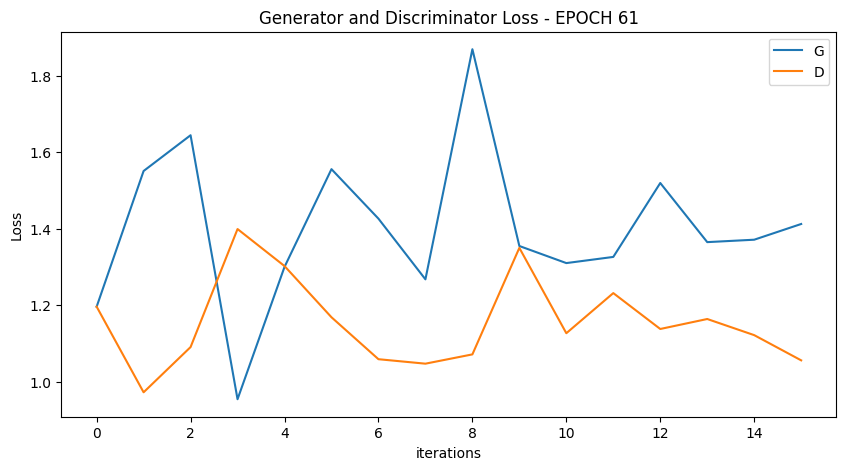

  0%|          | 0/16 [00:00<?, ?it/s]

[63/100][8/16] Loss_D: 1.3195 Loss_G: 1.4280 D(x): 0.5713 D(G(z)): 0.4660 / 0.2349
[63/100][16/16] Loss_D: 1.1269 Loss_G: 1.6439 D(x): 0.5060 D(G(z)): 0.2801 / 0.1693


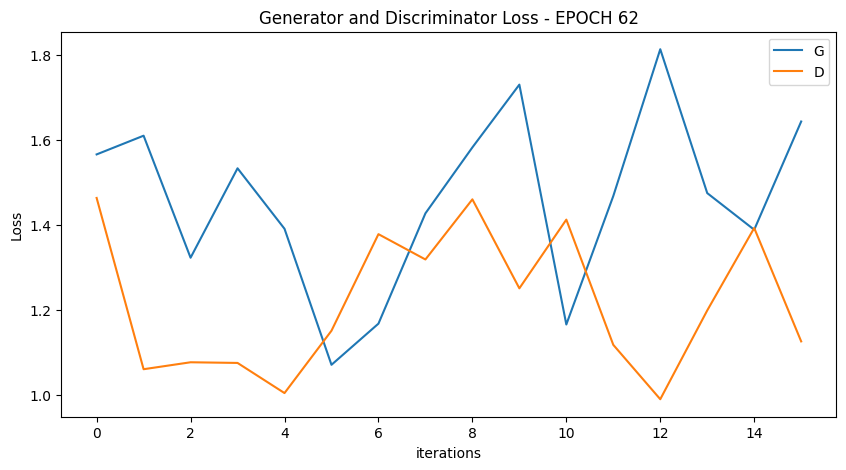

  0%|          | 0/16 [00:00<?, ?it/s]

[64/100][8/16] Loss_D: 1.2570 Loss_G: 1.4592 D(x): 0.4945 D(G(z)): 0.3810 / 0.2225
[64/100][16/16] Loss_D: 1.4094 Loss_G: 1.2549 D(x): 0.3098 D(G(z)): 0.1787 / 0.2784


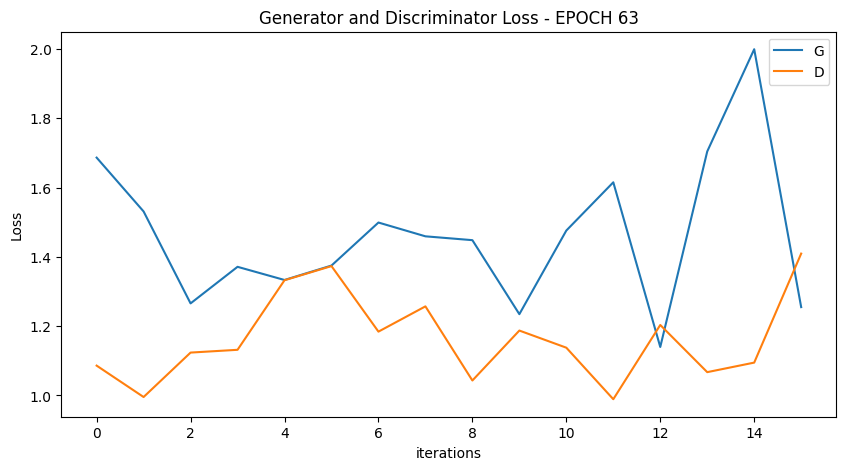

  0%|          | 0/16 [00:00<?, ?it/s]

[65/100][8/16] Loss_D: 1.1499 Loss_G: 1.3549 D(x): 0.6579 D(G(z)): 0.4341 / 0.2476
[65/100][16/16] Loss_D: 1.4241 Loss_G: 1.3614 D(x): 0.4569 D(G(z)): 0.4210 / 0.2386


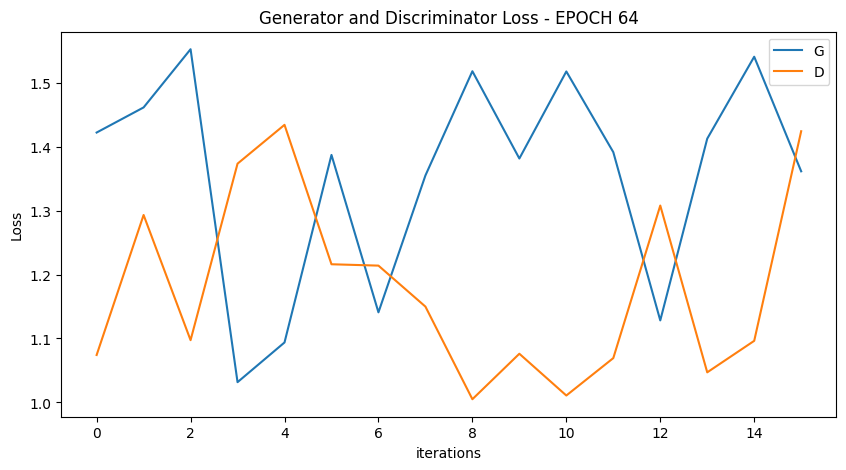

  0%|          | 0/16 [00:00<?, ?it/s]

[66/100][8/16] Loss_D: 1.2616 Loss_G: 1.1028 D(x): 0.5335 D(G(z)): 0.3956 / 0.3178
[66/100][16/16] Loss_D: 1.0519 Loss_G: 1.4337 D(x): 0.4830 D(G(z)): 0.2501 / 0.2335


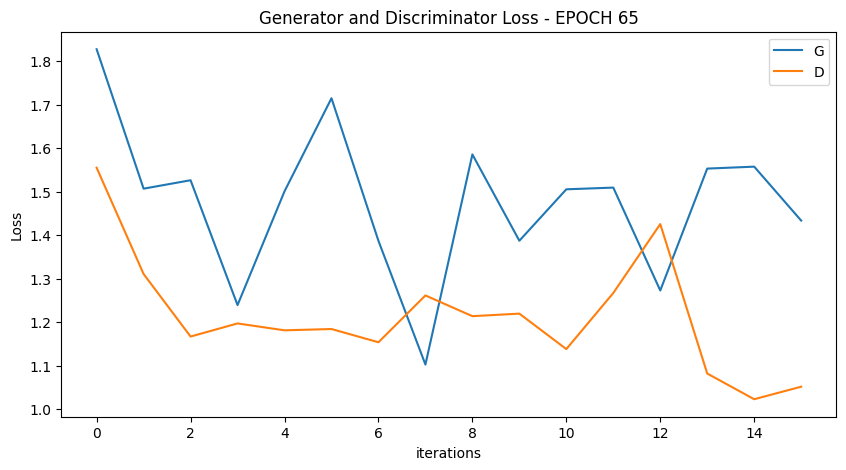

  0%|          | 0/16 [00:00<?, ?it/s]

[67/100][8/16] Loss_D: 1.1470 Loss_G: 1.4573 D(x): 0.6284 D(G(z)): 0.4239 / 0.2243
[67/100][16/16] Loss_D: 1.1926 Loss_G: 2.0697 D(x): 0.7047 D(G(z)): 0.5000 / 0.1243


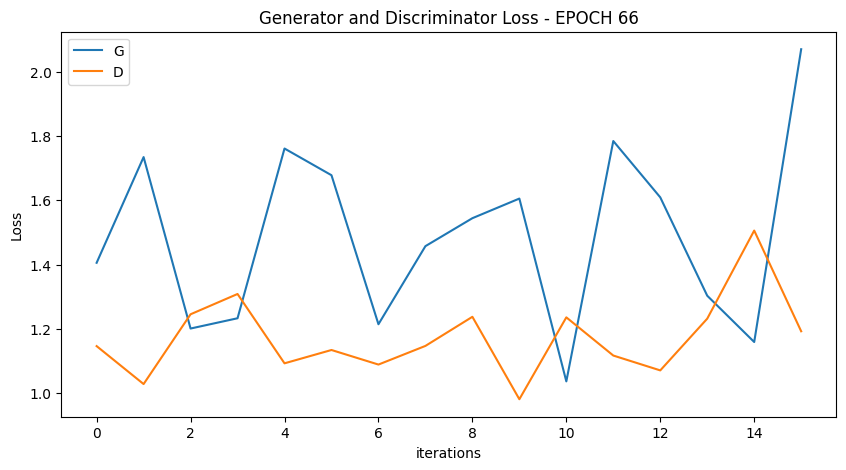

  0%|          | 0/16 [00:00<?, ?it/s]

[68/100][8/16] Loss_D: 1.0538 Loss_G: 1.3685 D(x): 0.5426 D(G(z)): 0.2988 / 0.2381
[68/100][16/16] Loss_D: 1.3003 Loss_G: 1.4432 D(x): 0.4524 D(G(z)): 0.3573 / 0.2333


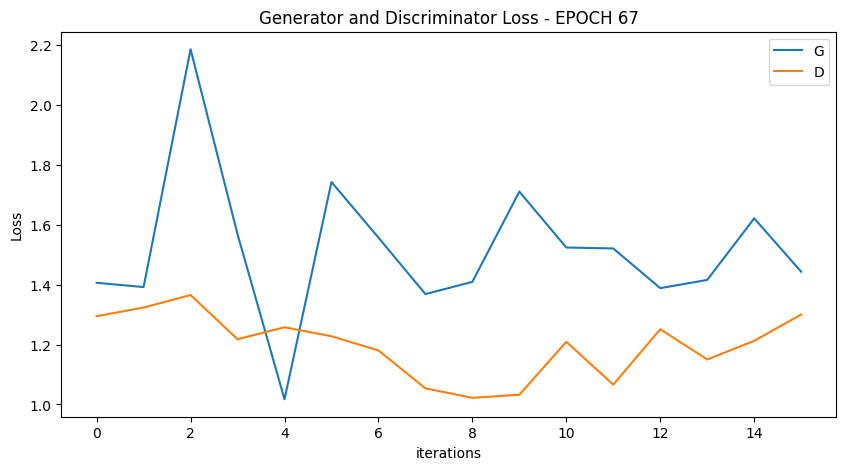

  0%|          | 0/16 [00:00<?, ?it/s]

[69/100][8/16] Loss_D: 1.2095 Loss_G: 1.9984 D(x): 0.6764 D(G(z)): 0.4996 / 0.1167
[69/100][16/16] Loss_D: 1.2518 Loss_G: 1.3678 D(x): 0.4268 D(G(z)): 0.3204 / 0.2451


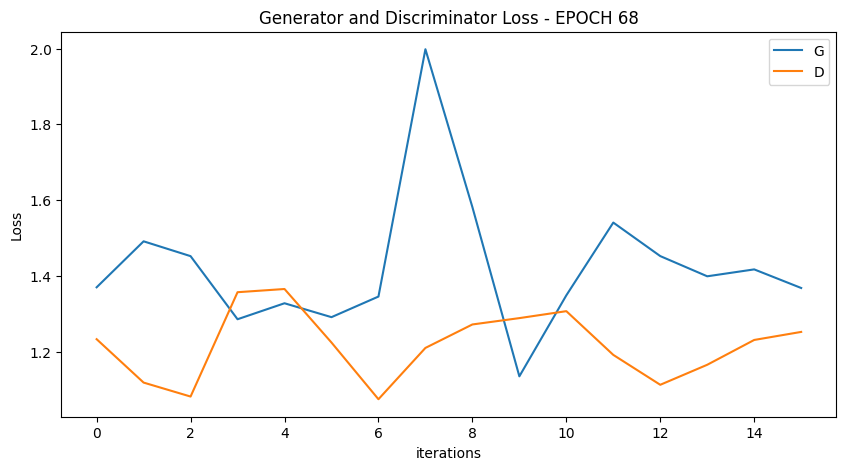

  0%|          | 0/16 [00:00<?, ?it/s]

[70/100][8/16] Loss_D: 1.0490 Loss_G: 1.4517 D(x): 0.6213 D(G(z)): 0.3824 / 0.2206
[70/100][16/16] Loss_D: 1.0192 Loss_G: 1.5658 D(x): 0.6176 D(G(z)): 0.3559 / 0.1884


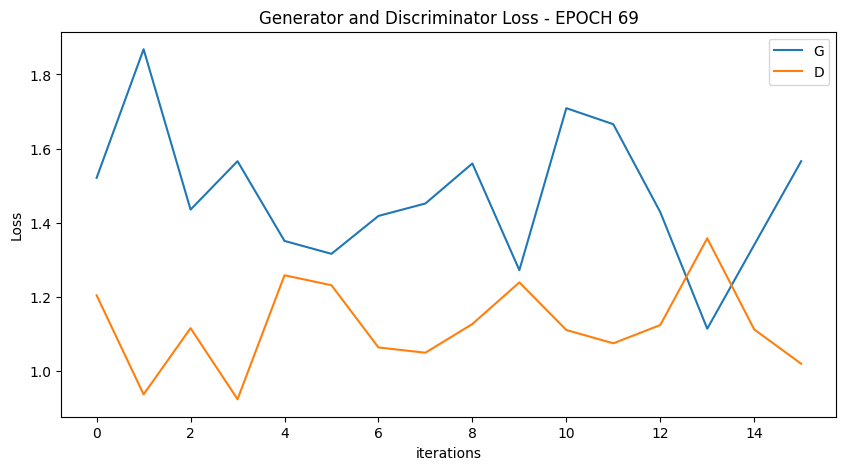

  0%|          | 0/16 [00:00<?, ?it/s]

[71/100][8/16] Loss_D: 1.3545 Loss_G: 1.3524 D(x): 0.3497 D(G(z)): 0.2545 / 0.2581
[71/100][16/16] Loss_D: 1.0176 Loss_G: 1.4904 D(x): 0.6404 D(G(z)): 0.3743 / 0.2038


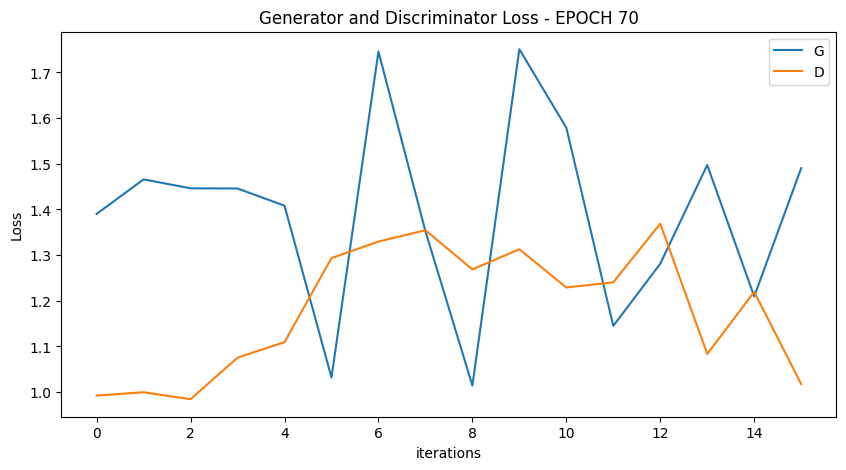

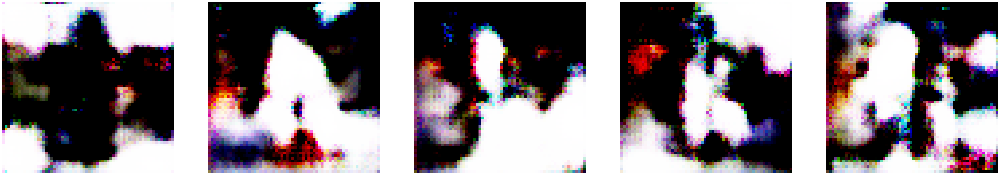

  0%|          | 0/16 [00:00<?, ?it/s]

[72/100][8/16] Loss_D: 1.2969 Loss_G: 1.3383 D(x): 0.5331 D(G(z)): 0.4332 / 0.2583
[72/100][16/16] Loss_D: 1.4197 Loss_G: 1.5147 D(x): 0.4201 D(G(z)): 0.3892 / 0.2213


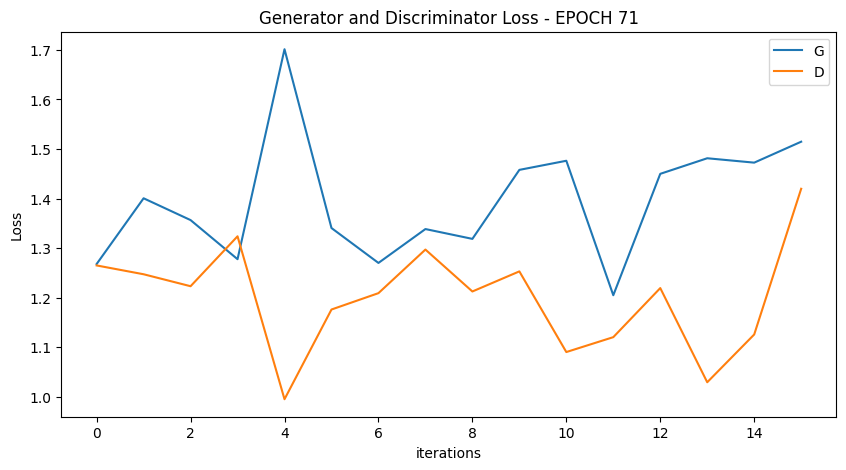

  0%|          | 0/16 [00:00<?, ?it/s]

[73/100][8/16] Loss_D: 1.2348 Loss_G: 1.3740 D(x): 0.5660 D(G(z)): 0.4248 / 0.2400
[73/100][16/16] Loss_D: 0.9309 Loss_G: 1.8224 D(x): 0.6301 D(G(z)): 0.3212 / 0.1463


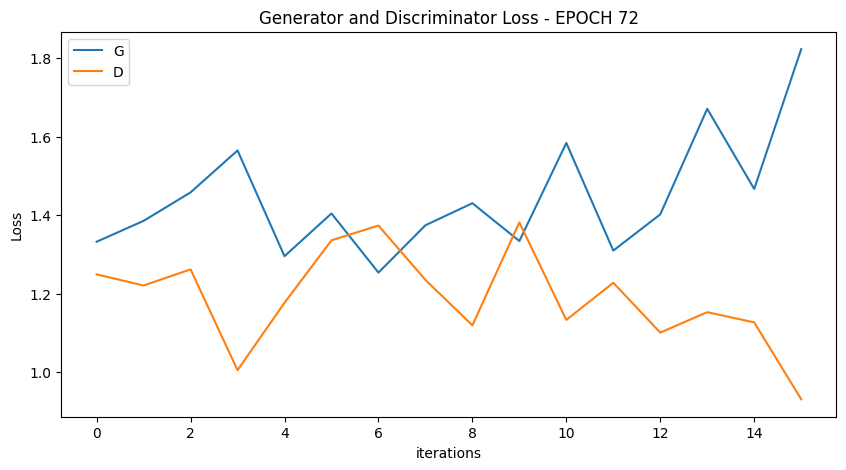

  0%|          | 0/16 [00:00<?, ?it/s]

[74/100][8/16] Loss_D: 1.0810 Loss_G: 1.4378 D(x): 0.5821 D(G(z)): 0.3711 / 0.2208
[74/100][16/16] Loss_D: 1.4121 Loss_G: 2.2265 D(x): 0.6366 D(G(z)): 0.5508 / 0.1132


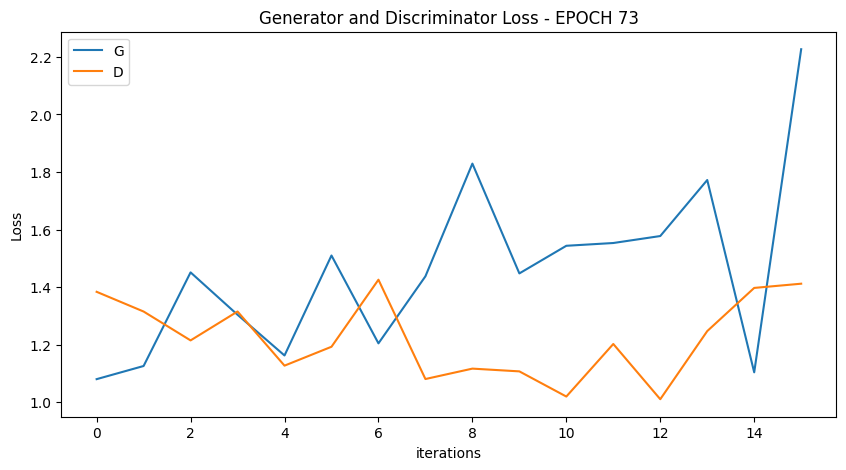

  0%|          | 0/16 [00:00<?, ?it/s]

[75/100][8/16] Loss_D: 1.3766 Loss_G: 1.2762 D(x): 0.3298 D(G(z)): 0.2355 / 0.2765
[75/100][16/16] Loss_D: 1.6749 Loss_G: 0.9241 D(x): 0.2754 D(G(z)): 0.2978 / 0.4016


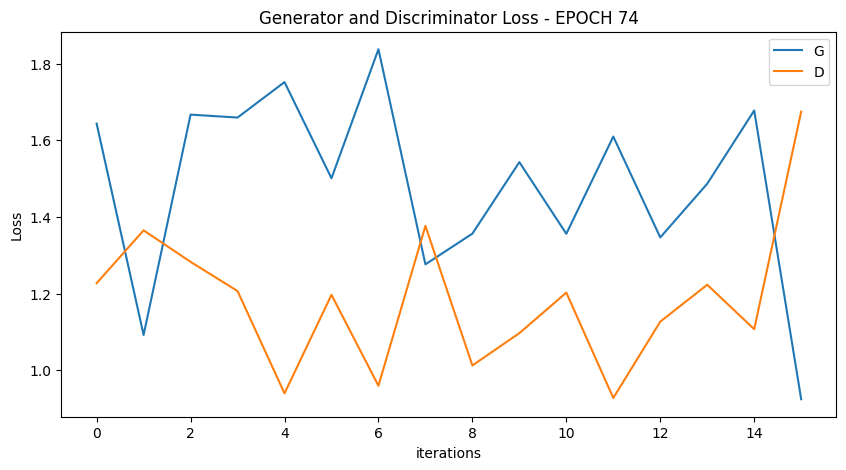

  0%|          | 0/16 [00:00<?, ?it/s]

[76/100][8/16] Loss_D: 1.1581 Loss_G: 1.5500 D(x): 0.5715 D(G(z)): 0.3869 / 0.1968
[76/100][16/16] Loss_D: 1.0714 Loss_G: 1.5505 D(x): 0.4647 D(G(z)): 0.2292 / 0.1958


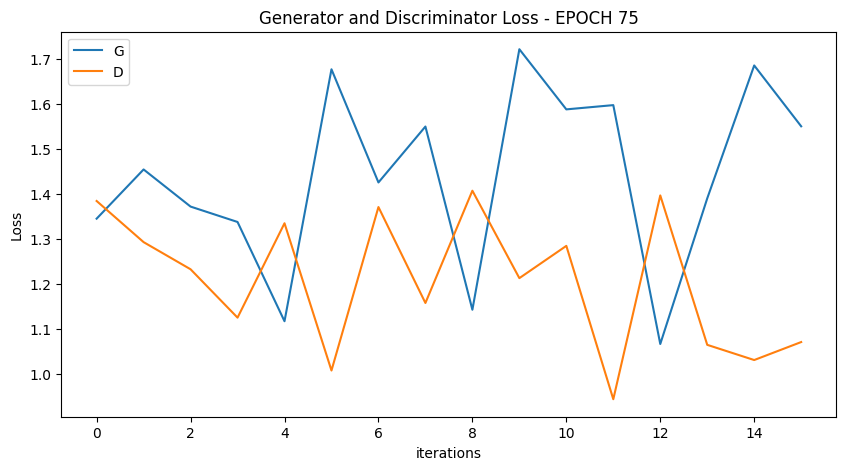

  0%|          | 0/16 [00:00<?, ?it/s]

[77/100][8/16] Loss_D: 1.4811 Loss_G: 1.4639 D(x): 0.4422 D(G(z)): 0.4387 / 0.2262
[77/100][16/16] Loss_D: 0.9991 Loss_G: 1.6505 D(x): 0.5740 D(G(z)): 0.3153 / 0.1772


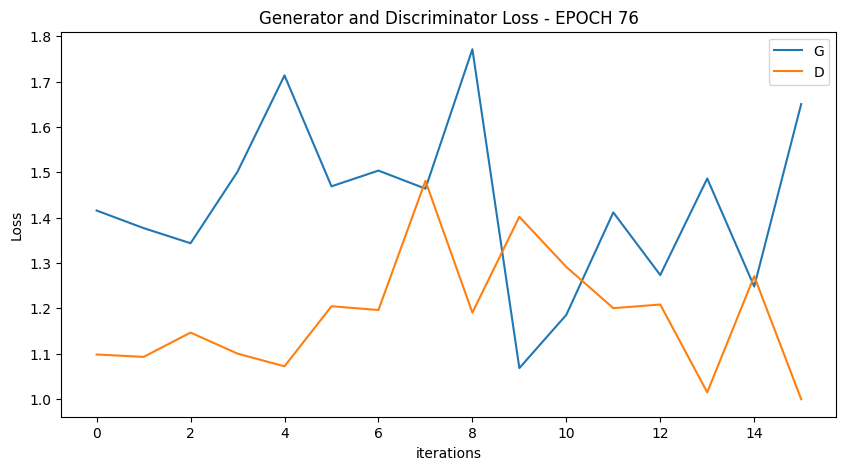

  0%|          | 0/16 [00:00<?, ?it/s]

[78/100][8/16] Loss_D: 1.3651 Loss_G: 1.3596 D(x): 0.4339 D(G(z)): 0.3766 / 0.2427
[78/100][16/16] Loss_D: 1.0227 Loss_G: 1.6894 D(x): 0.6073 D(G(z)): 0.3316 / 0.1687


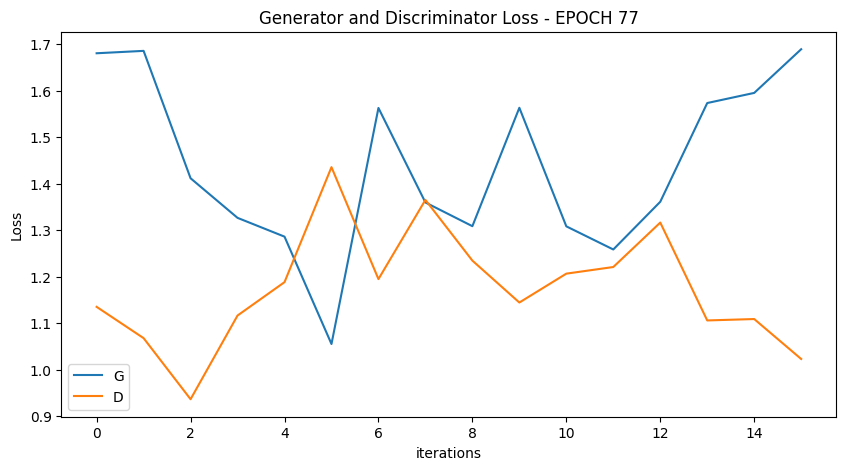

  0%|          | 0/16 [00:00<?, ?it/s]

[79/100][8/16] Loss_D: 1.2471 Loss_G: 1.2162 D(x): 0.4920 D(G(z)): 0.3745 / 0.2814
[79/100][16/16] Loss_D: 1.1477 Loss_G: 1.4336 D(x): 0.5293 D(G(z)): 0.3278 / 0.2164


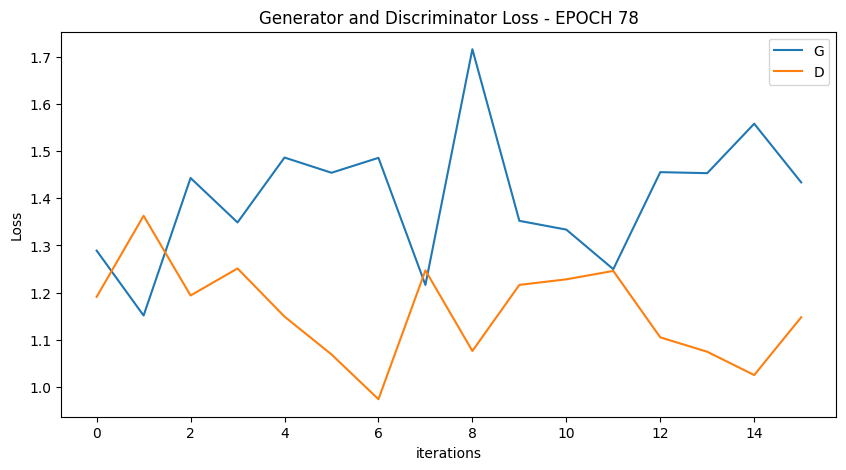

  0%|          | 0/16 [00:00<?, ?it/s]

[80/100][8/16] Loss_D: 1.2148 Loss_G: 1.2233 D(x): 0.4866 D(G(z)): 0.3571 / 0.2828
[80/100][16/16] Loss_D: 1.2930 Loss_G: 1.4529 D(x): 0.5022 D(G(z)): 0.4094 / 0.2264


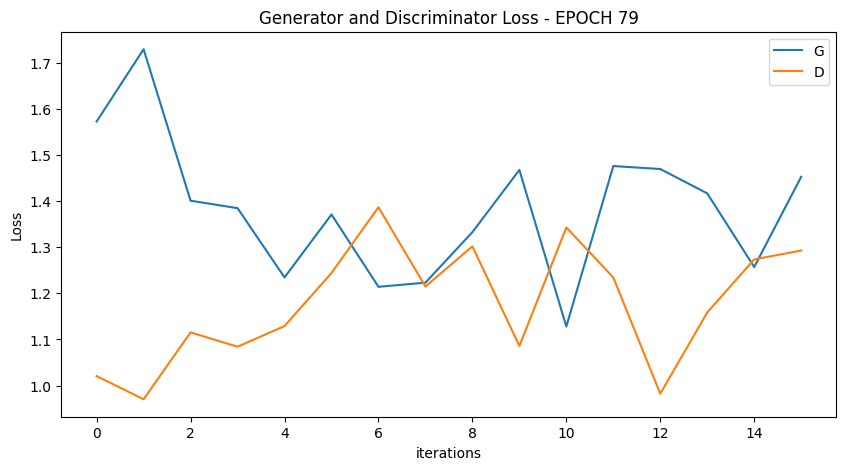

  0%|          | 0/16 [00:00<?, ?it/s]

[81/100][8/16] Loss_D: 1.2023 Loss_G: 1.3490 D(x): 0.4753 D(G(z)): 0.3399 / 0.2503
[81/100][16/16] Loss_D: 1.2923 Loss_G: 1.2043 D(x): 0.4640 D(G(z)): 0.3592 / 0.2874


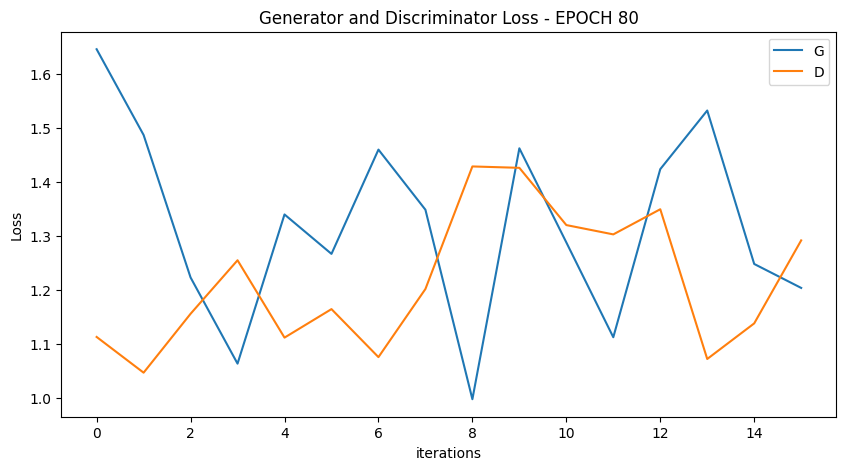

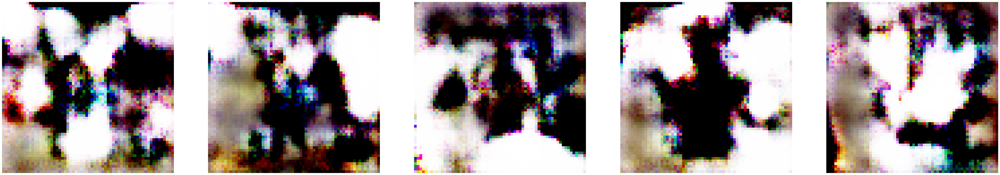

  0%|          | 0/16 [00:00<?, ?it/s]

[82/100][8/16] Loss_D: 1.1234 Loss_G: 1.2380 D(x): 0.5666 D(G(z)): 0.3828 / 0.2749
[82/100][16/16] Loss_D: 1.1723 Loss_G: 1.6977 D(x): 0.6146 D(G(z)): 0.4427 / 0.1670


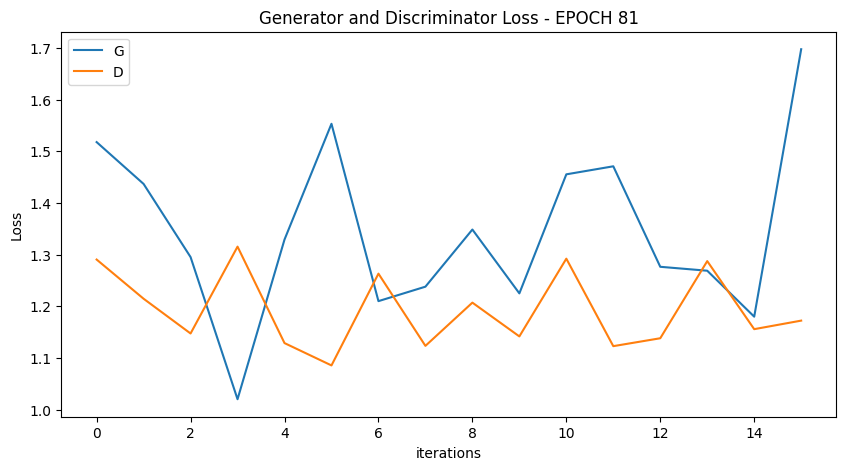

  0%|          | 0/16 [00:00<?, ?it/s]

[83/100][8/16] Loss_D: 1.1053 Loss_G: 1.3946 D(x): 0.5236 D(G(z)): 0.3153 / 0.2328
[83/100][16/16] Loss_D: 0.9674 Loss_G: 1.4825 D(x): 0.5513 D(G(z)): 0.2677 / 0.2055


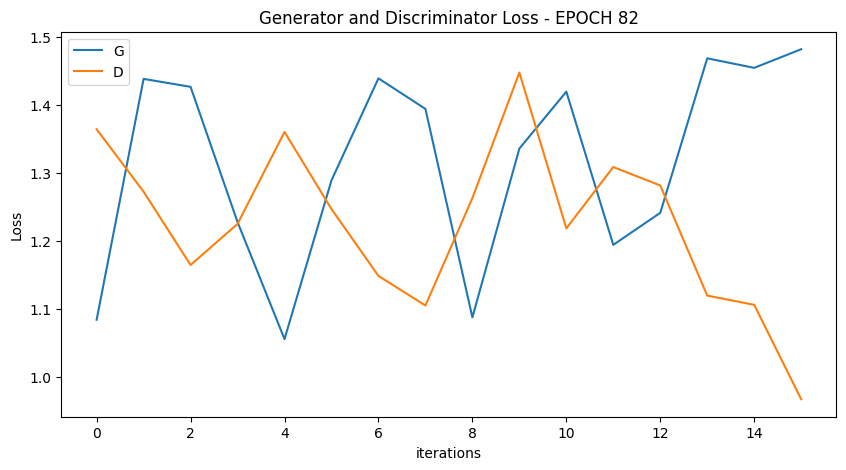

  0%|          | 0/16 [00:00<?, ?it/s]

[84/100][8/16] Loss_D: 1.1452 Loss_G: 1.3577 D(x): 0.5323 D(G(z)): 0.3563 / 0.2435
[84/100][16/16] Loss_D: 1.1750 Loss_G: 1.4910 D(x): 0.5464 D(G(z)): 0.3867 / 0.2032


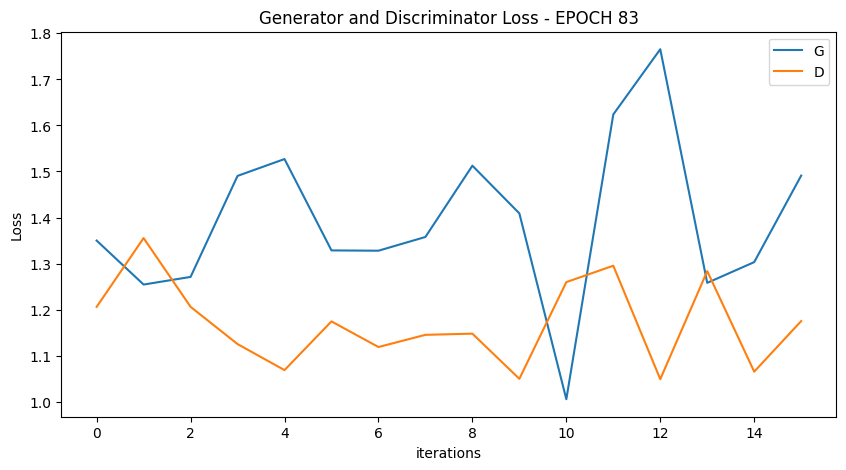

  0%|          | 0/16 [00:00<?, ?it/s]

[85/100][8/16] Loss_D: 1.1613 Loss_G: 1.3051 D(x): 0.5047 D(G(z)): 0.3518 / 0.2536
[85/100][16/16] Loss_D: 1.3690 Loss_G: 1.5477 D(x): 0.4875 D(G(z)): 0.4365 / 0.1966


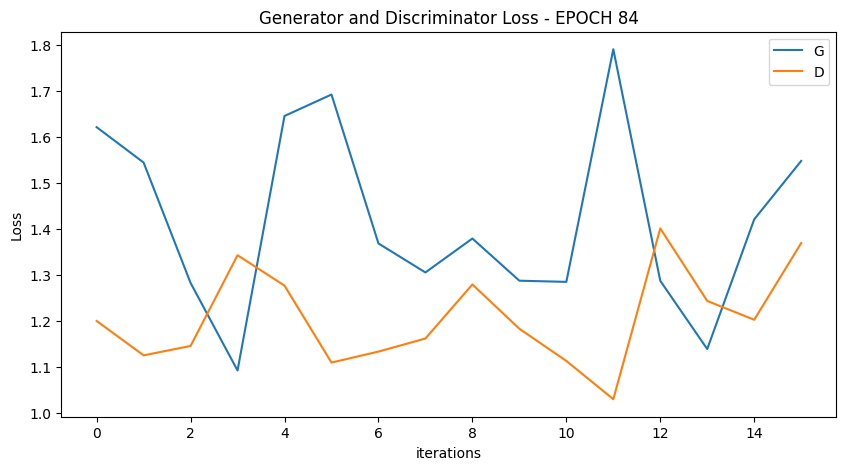

  0%|          | 0/16 [00:00<?, ?it/s]

[86/100][8/16] Loss_D: 1.3051 Loss_G: 1.6020 D(x): 0.5063 D(G(z)): 0.4327 / 0.1848
[86/100][16/16] Loss_D: 1.3490 Loss_G: 1.1771 D(x): 0.4034 D(G(z)): 0.3405 / 0.2996


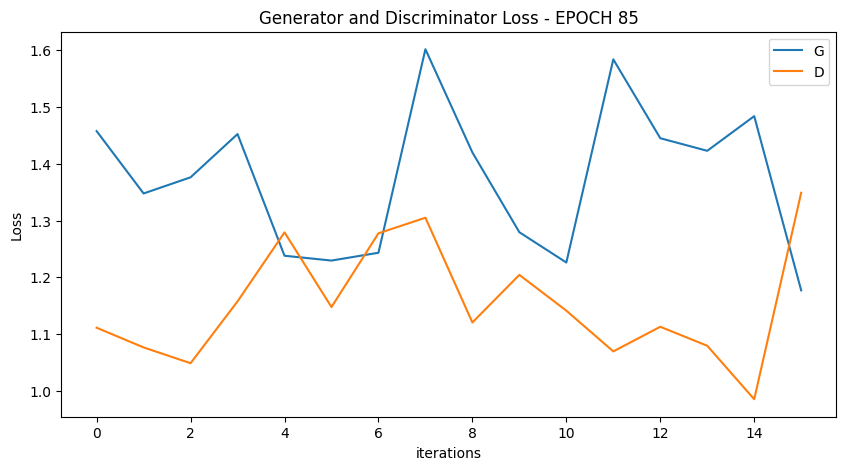

  0%|          | 0/16 [00:00<?, ?it/s]

[87/100][8/16] Loss_D: 1.1526 Loss_G: 1.2792 D(x): 0.4971 D(G(z)): 0.3291 / 0.2629
[87/100][16/16] Loss_D: 1.1409 Loss_G: 1.6067 D(x): 0.4738 D(G(z)): 0.2924 / 0.1889


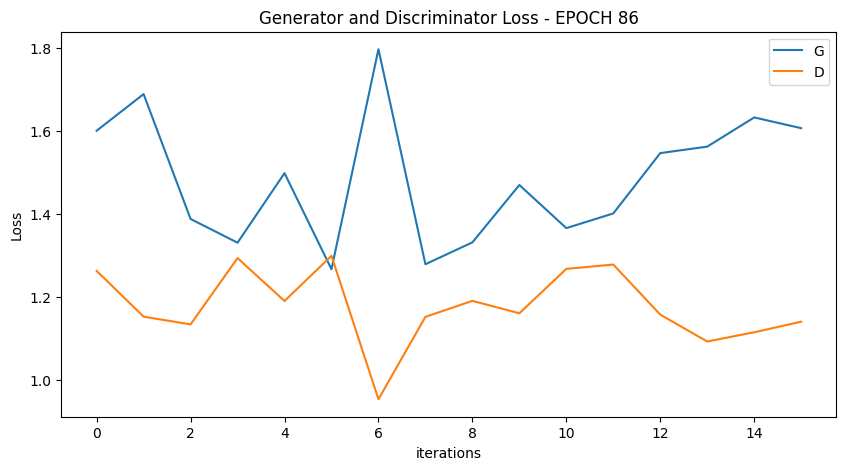

  0%|          | 0/16 [00:00<?, ?it/s]

[88/100][8/16] Loss_D: 1.1050 Loss_G: 1.5093 D(x): 0.5480 D(G(z)): 0.3536 / 0.2031
[88/100][16/16] Loss_D: 1.1911 Loss_G: 1.7592 D(x): 0.4198 D(G(z)): 0.2388 / 0.1679


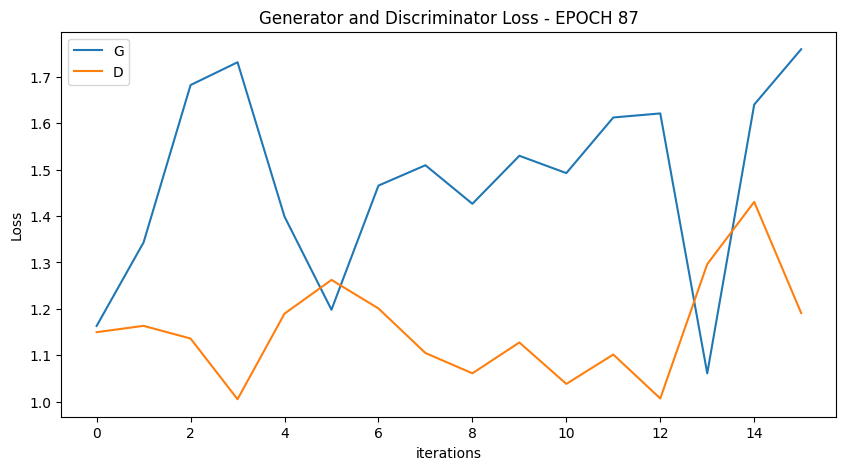

  0%|          | 0/16 [00:00<?, ?it/s]

[89/100][8/16] Loss_D: 1.1972 Loss_G: 1.6053 D(x): 0.6357 D(G(z)): 0.4582 / 0.2053
[89/100][16/16] Loss_D: 1.3052 Loss_G: 1.6625 D(x): 0.4982 D(G(z)): 0.4014 / 0.1836


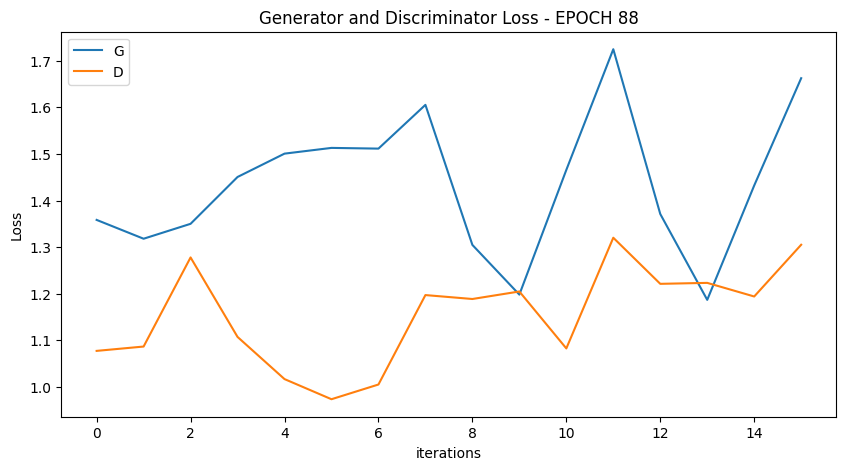

  0%|          | 0/16 [00:00<?, ?it/s]

[90/100][8/16] Loss_D: 1.2535 Loss_G: 1.2848 D(x): 0.5401 D(G(z)): 0.4095 / 0.2810
[90/100][16/16] Loss_D: 0.9781 Loss_G: 1.5764 D(x): 0.5883 D(G(z)): 0.3064 / 0.1857


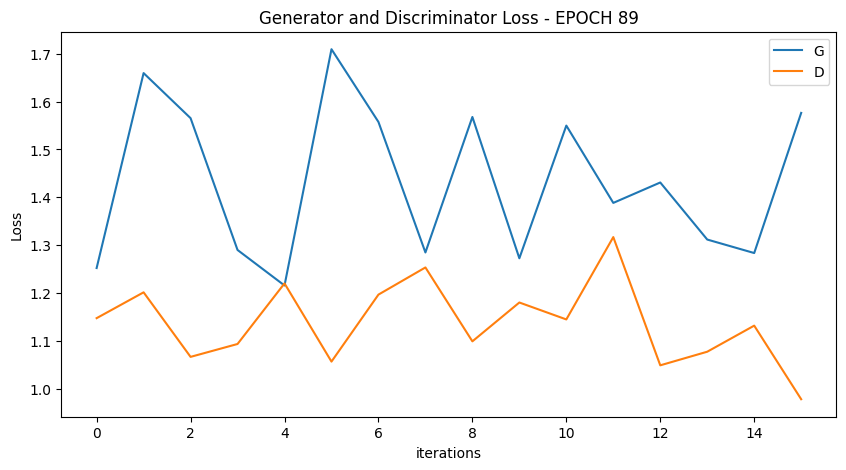

  0%|          | 0/16 [00:00<?, ?it/s]

[91/100][8/16] Loss_D: 1.0867 Loss_G: 1.4147 D(x): 0.5356 D(G(z)): 0.3266 / 0.2295
[91/100][16/16] Loss_D: 0.8457 Loss_G: 1.7793 D(x): 0.6755 D(G(z)): 0.2904 / 0.1493


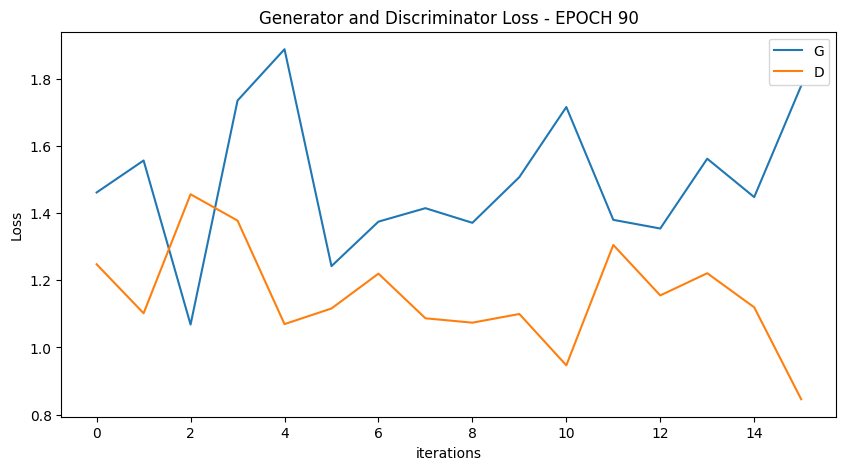

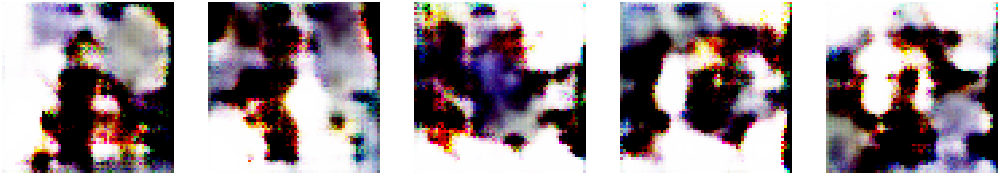

  0%|          | 0/16 [00:00<?, ?it/s]

[92/100][8/16] Loss_D: 0.9892 Loss_G: 1.5792 D(x): 0.7103 D(G(z)): 0.4128 / 0.1882
[92/100][16/16] Loss_D: 0.9908 Loss_G: 1.8802 D(x): 0.6831 D(G(z)): 0.3886 / 0.1381


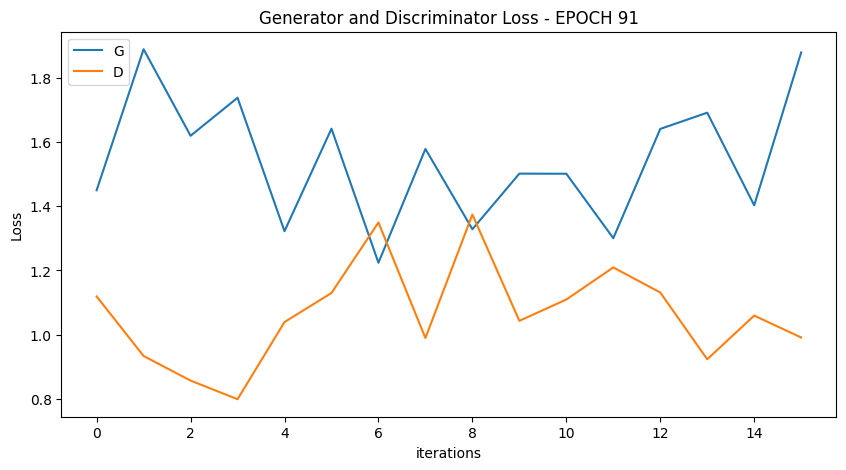

  0%|          | 0/16 [00:00<?, ?it/s]

[93/100][8/16] Loss_D: 1.0543 Loss_G: 1.3646 D(x): 0.5582 D(G(z)): 0.3207 / 0.2502
[93/100][16/16] Loss_D: 1.1644 Loss_G: 1.4746 D(x): 0.5524 D(G(z)): 0.3874 / 0.2153


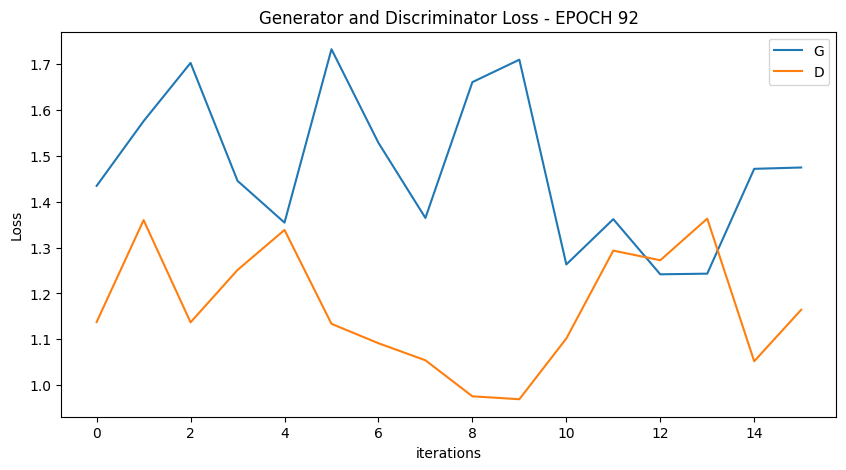

  0%|          | 0/16 [00:00<?, ?it/s]

[94/100][8/16] Loss_D: 1.0888 Loss_G: 1.3901 D(x): 0.6082 D(G(z)): 0.3762 / 0.2355
[94/100][16/16] Loss_D: 1.1154 Loss_G: 1.6577 D(x): 0.6106 D(G(z)): 0.4213 / 0.1778


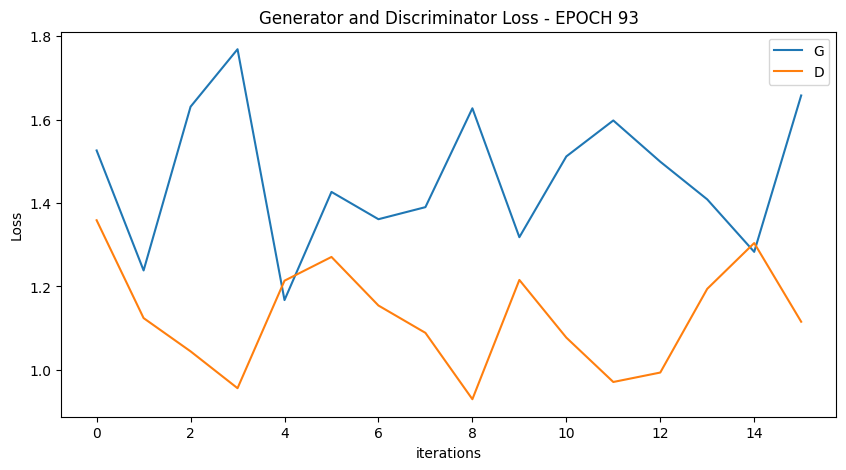

  0%|          | 0/16 [00:00<?, ?it/s]

[95/100][8/16] Loss_D: 1.2922 Loss_G: 1.4283 D(x): 0.6818 D(G(z)): 0.5171 / 0.2394
[95/100][16/16] Loss_D: 1.3738 Loss_G: 1.5073 D(x): 0.5422 D(G(z)): 0.4730 / 0.2162


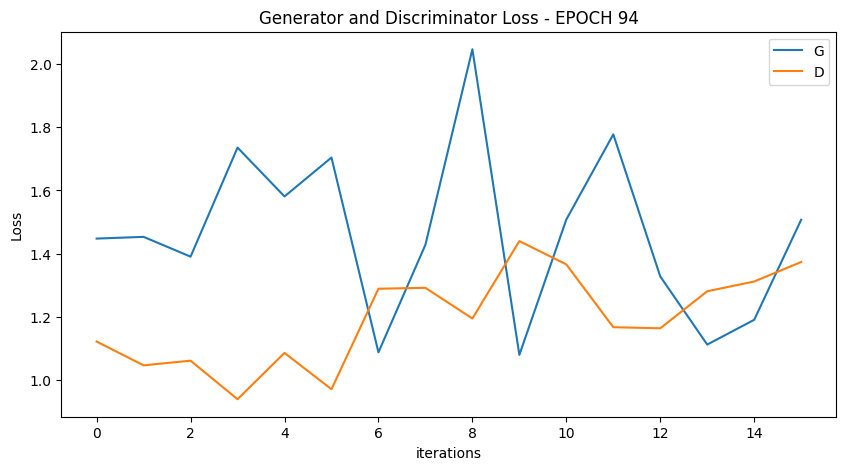

  0%|          | 0/16 [00:00<?, ?it/s]

[96/100][8/16] Loss_D: 0.9808 Loss_G: 1.5158 D(x): 0.5558 D(G(z)): 0.2734 / 0.2198
[96/100][16/16] Loss_D: 1.3363 Loss_G: 1.3334 D(x): 0.3864 D(G(z)): 0.2907 / 0.2544


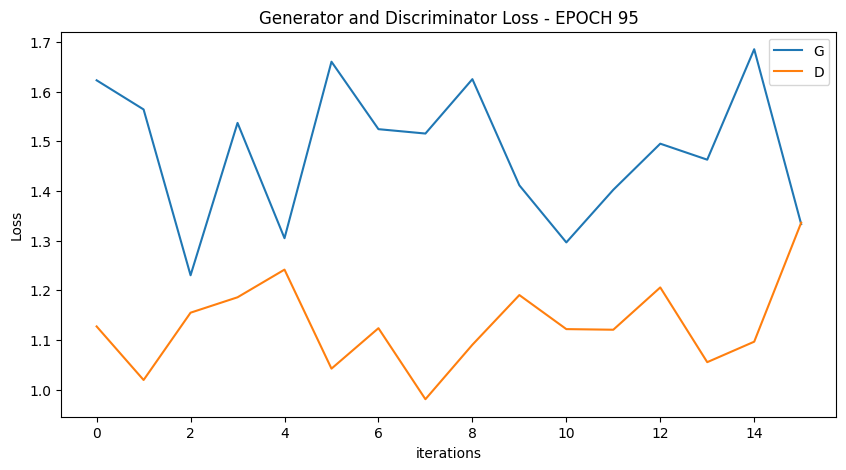

  0%|          | 0/16 [00:00<?, ?it/s]

[97/100][8/16] Loss_D: 1.1014 Loss_G: 1.5382 D(x): 0.5731 D(G(z)): 0.3697 / 0.1954
[97/100][16/16] Loss_D: 1.3431 Loss_G: 1.7638 D(x): 0.6064 D(G(z)): 0.5025 / 0.1586


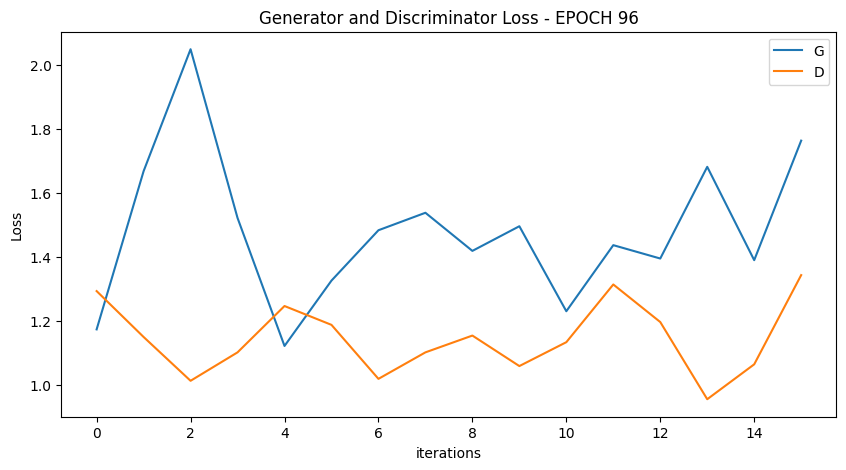

  0%|          | 0/16 [00:00<?, ?it/s]

[98/100][8/16] Loss_D: 0.9840 Loss_G: 1.6112 D(x): 0.5328 D(G(z)): 0.2609 / 0.1855
[98/100][16/16] Loss_D: 1.2814 Loss_G: 1.2625 D(x): 0.3977 D(G(z)): 0.2891 / 0.2695


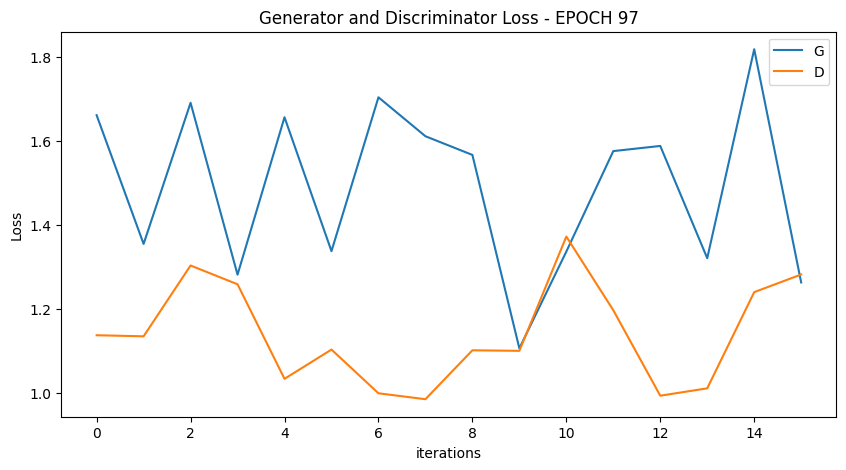

  0%|          | 0/16 [00:00<?, ?it/s]

[99/100][8/16] Loss_D: 1.0705 Loss_G: 1.3505 D(x): 0.6596 D(G(z)): 0.4199 / 0.2480
[99/100][16/16] Loss_D: 1.2422 Loss_G: 1.3923 D(x): 0.3596 D(G(z)): 0.1890 / 0.2300


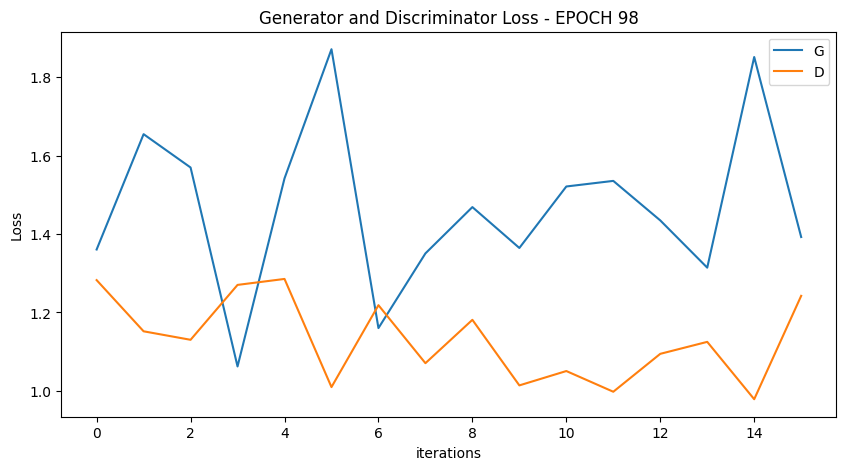

  0%|          | 0/16 [00:00<?, ?it/s]

[100/100][8/16] Loss_D: 1.1555 Loss_G: 1.3842 D(x): 0.6257 D(G(z)): 0.4395 / 0.2409
[100/100][16/16] Loss_D: 1.2572 Loss_G: 1.3118 D(x): 0.4346 D(G(z)): 0.3263 / 0.2653


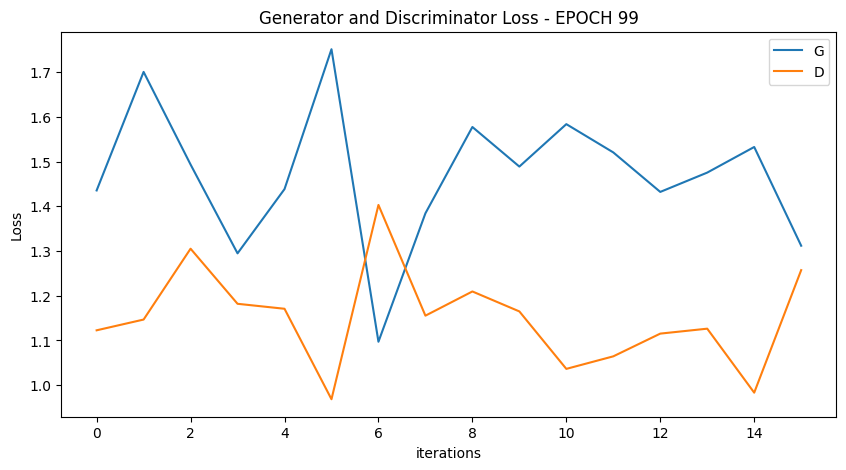

In [133]:
for epoch in range(epochs):
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        netG.zero_grad()
        labels.fill_(real_label)
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        G_losses.append(errG.item())
        D_losses.append(errD.item())
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)

Prikaz slika generisanih na osnovu prethodno istreniranog modela

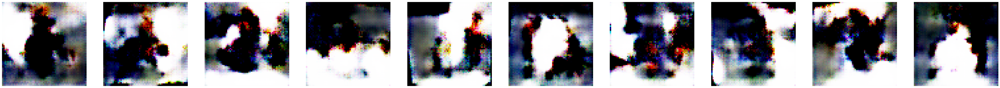

In [137]:
show_generated_img(10)

In [140]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)

    # Prikazivanje generisanih slika
    figure, axes = plt.subplots(1, len(sample), figsize=(10, 10))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)

    # Čuvanje generisanih slika
    output_dir = "/content/data/generated"
    os.makedirs(output_dir, exist_ok=True)
    for i, image in enumerate(sample):
        image_path = os.path.join(output_dir, f"generated_image_{i+1}.png")
        plt.imsave(image_path, image)
        print(f"Generisana slika {i+1} je sačuvana kao {image_path}")

    plt.show()
    plt.close()



Prikazivanje slika iz *test* foldera

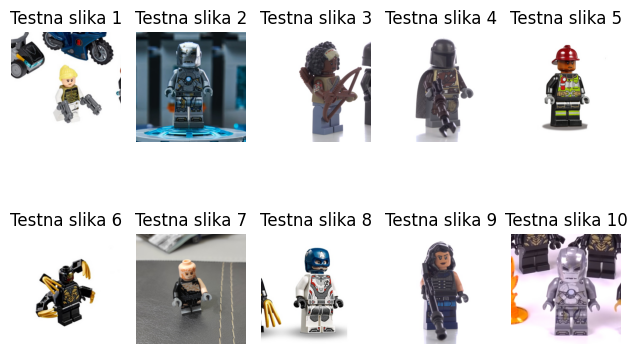

In [141]:
import os
import matplotlib.pyplot as plt
from PIL import Image

test_dir = "/content/data/test/"

# Učitavanje testnih slika iz direktorijuma
test_images = []
num_images = 10  # Broj slika za izvlačenje i prikazivanje

# Provera broja dostupnih slika u direktorijumu
num_files = len(os.listdir(test_dir))
if num_images > num_files:
    num_images = num_files

# Izvlačenje i prikazivanje testnih slika
for i, filename in enumerate(os.listdir(test_dir)):
    if i >= num_images:
        break

    img = Image.open(os.path.join(test_dir, filename))
    test_images.append(img)

    plt.subplot(2, num_images // 2, i + 1)
    plt.imshow(img)
    plt.title("Testna slika {}".format(i + 1))
    plt.axis("off")

plt.tight_layout()
plt.show()


Prikaz testne slike i pet nasumnicno izabranih novih-generisanih slika

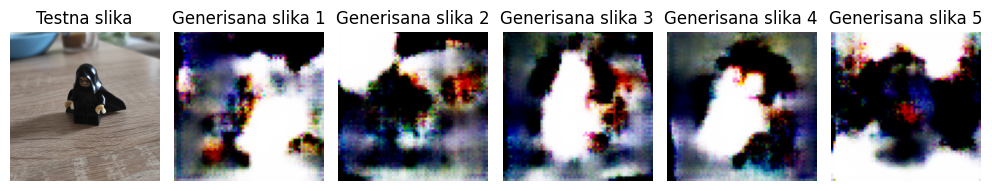

In [144]:
import random
import matplotlib.pyplot as plt
import os
from PIL import Image
import numpy as np

test_dir = "/content/data/test/"  # Putanja do direktorijuma sa testnim slikama
generated_images_dir = "/content/data/generated/"  # Putanja do direktorijuma za čuvanje generisanih slika

# Učitavanje slučajno odabrane testne slike
test_image_files = os.listdir(test_dir)
random_test_image_file = random.choice(test_image_files)
random_test_image = Image.open(os.path.join(test_dir, random_test_image_file))

# Generisanje i prikazivanje generisanih slika
n_images = 5
sample = []
for _ in range(n_images):
    noise = torch.randn(1, nz, 1, 1, device=device)
    gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
    gen_image = gen_image.numpy().transpose(1, 2, 0)
    sample.append(gen_image)

# Prikazivanje generisanih slika
figure, axes = plt.subplots(1, n_images+1, figsize=(10, 4))
axes[0].imshow(random_test_image)
axes[0].set_title("Testna slika")
axes[0].axis("off")

for i in range(n_images):
    axes[i+1].imshow(sample[i])
    axes[i+1].set_title(f"Generisana slika {i+1}")
    axes[i+1].axis("off")

plt.tight_layout()
plt.show()


# SSIM vrednosti (Structural Similarity Index Measure) između testne slike i generisanih slika
SSIM je metrika koja se koristi za merenje sličnosti između dve slike, pri čemu se uzima u obzir strukturna sličnost, kontrast i svetlina.

SSIM vrednosti su između 0 i 1, gde vrednost 1 označava potpunu sličnost između slika, a vrednost bliža nuli označava veću razliku između slika.

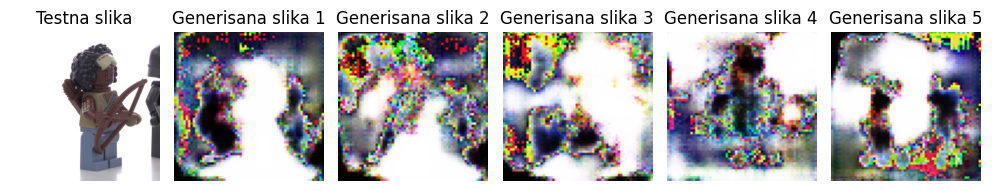

SSIM vrednosti:
Generisana slika 1: 0.2656
Generisana slika 2: 0.2881
Generisana slika 3: 0.3150
Generisana slika 4: 0.4030
Generisana slika 5: 0.3178


In [147]:
import random
import matplotlib.pyplot as plt
import os
from PIL import Image
import numpy as np
from skimage.metrics import structural_similarity as ssim

test_dir = "/content/data/test/"  # Putanja do direktorijuma sa testnim slikama
generated_images_dir = "/content/data/generated/"  # Putanja do direktorijuma za čuvanje generisanih slika

# Učitavanje slučajno odabrane testne slike
test_image_files = os.listdir(test_dir)
random_test_image_file = random.choice(test_image_files)
random_test_image = Image.open(os.path.join(test_dir, random_test_image_file))
random_test_image_gray = random_test_image.convert("L")

# Generisanje i prikazivanje generisanih slika
n_images = 5
sample = []
sample_gray = []
for _ in range(n_images):
    noise = torch.randn(1, nz, 1, 1, device=device)
    gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
    gen_image = gen_image.numpy().transpose(1, 2, 0)
    gen_image = np.uint8(255 * gen_image)  # Konverzija u opseg 0-255
    gen_image_gray = Image.fromarray(gen_image).convert("L")
    gen_image_gray = gen_image_gray.resize(random_test_image_gray.size)  # Skaliranje na iste dimenzije kao testna slika
    sample.append(gen_image)
    sample_gray.append(gen_image_gray)

# Prikazivanje generisanih slika
figure, axes = plt.subplots(1, n_images+1, figsize=(10, 4))
axes[0].imshow(random_test_image)
axes[0].set_title("Testna slika")
axes[0].axis("off")

for i in range(n_images):
    axes[i+1].imshow(sample[i])
    axes[i+1].set_title(f"Generisana slika {i+1}")
    axes[i+1].axis("off")

plt.tight_layout()
plt.show()

# Računanje SSIM između testne slike i generisanih slika
ssim_scores = [ssim(np.array(random_test_image_gray), np.array(img_gray)) for img_gray in sample_gray]

# Prikazivanje rezultata
print("SSIM vrednosti:")
for i, score in enumerate(ssim_scores):
    print(f"Generisana slika {i+1}: {score:.4f}")


*Literatura*

[1] https://developers.google.com/machine-learning/gan

[2] https://machinelearningmastery.com/what-are-generative-adversarial-networks-gans/

[3] https://towardsdatascience.com/weight-initialization-techniques-in-neural-networks-26c649eb3b78

[4] https://arxiv.org/pdf/1406.2661.pdf


